# Coronavirus Disease (COVID-19)

https://github.com/owid/covid-19-data/tree/master/public/data/
https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv

# Import Libraries

In [1]:
import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import missingno as msno
from IPython import display
import matplotlib.pyplot as plt
from urllib.request import urlopen
from matplotlib.ticker import FuncFormatter

# Options and Settings

In [2]:
%matplotlib inline
plt.style.use(style='ggplot')
plt.rcParams['figure.autolayout'] = True
plt.rcParams['figure.figsize'] = [12, 9]
plt.rcParams['font.size'] = 12
pd.options.display.max_rows = 999
pd.options.display.max_columns = 200
pd.set_option('display.precision', 5)
pd.set_option('expand_frame_repr', True)
warnings.simplefilter('ignore')                                              

# Helper Functions

In [3]:
# helper functions to format y-axis
def billion(x, pos):
    return '%1.1fB' % (x * 1e-9)

format_bill = FuncFormatter(billion)


def million(x, pos):
    return '%1.1fM' % (x * 1e-6)

format_mill = FuncFormatter(million)


def thousand(x, pos):
    return '%1.1fK' % (x * 1e-3)

format_tsd = FuncFormatter(thousand)


def original(x, pos):
    return '%1.1f' % (x * 1)

format_orig = FuncFormatter(original)



def cntplot(data: pd.DataFrame, orient: str, palette: str|list|dict, dodge: bool, x=None, y=None, hue=None, order=None, hue_order=None, color=None, ax=None, **kwargs):
  '''
  
  Helper function for plotting countplots

  Parameters
  ----------

  data: pd.DataFrame
        pandas dataframe

  orient: str
        orientation of the plot
  
  palette: palette name, list or dict
        colors to use for different levels

  dodge: bool
        whether elements should be shifted along the categorial axis

  x,y,hue: None
        inputs for plotting long-form data

  Returns: ax
        Returns the axes object with the plot drawn
        
  '''

  return sns.countplot(data=data, x=x, y=y, hue=hue, order=order, hue_order=hue_order, orient=orient, color=color, palette=palette, dodge=dodge, ax=ax, **kwargs)



def plot_pie(shadow: bool, startangle: float, normalize: bool, x=None, labels=None, explode=None, autopct=None, data=None, **kwargs):
      '''
      Helper function for plotting pie charts

      Parameters
      ----------

      data: pd.DataFrame
           pandas dataframe

      x: None
           array like
      
      explode: None
            fraction of radius to offset each wedge
      
      autopct: None
            string function to label chart

      shadow: True
            draw shadow beneath the pie
      
      normalize: bool
            when true, makes a full pie 

      startangle: float
            angle by which the start of the pie is rotated
            

      Returns: pie chart
      
      '''

      return plt.pie(x=x, explode=explode, labels=labels, autopct=autopct, shadow=shadow, startangle=startangle, normalize=normalize, data=data, **kwargs)

# Load Image

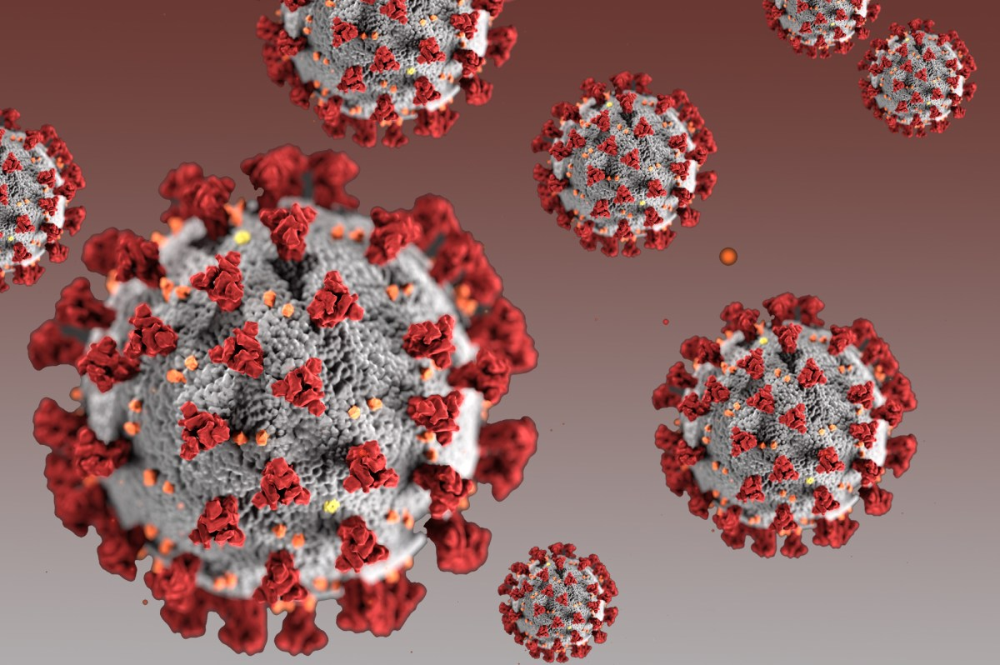

In [4]:
image_url = 'https://i0.wp.com/calmatters.org/wp-content/uploads/2020/02/Coronavirus_illustration.jpg?fit=1200%2C798&ssl=1'
Image.open(urlopen(image_url))

# Fetch Data

In [5]:
url = 'https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv'
df = pd.read_csv(url)

# Head and Tail

In [6]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


In [7]:
df.tail()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
311302,ZWE,Africa,Zimbabwe,2023-05-13,264821.0,5.0,10.286,5690.0,1.0,0.429,16226.241,0.306,0.630,348.64,0.061,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
311303,ZWE,Africa,Zimbabwe,2023-05-14,264841.0,20.0,10.714,5690.0,0.0,0.429,16227.467,1.225,0.656,348.64,0.000,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
311304,ZWE,Africa,Zimbabwe,2023-05-15,264848.0,7.0,10.286,5690.0,0.0,0.286,16227.895,0.429,0.630,348.64,0.000,0.018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
311305,ZWE,Africa,Zimbabwe,2023-05-16,264848.0,0.0,9.429,5690.0,0.0,0.286,16227.895,0.000,0.578,348.64,0.000,0.018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
311306,ZWE,Africa,Zimbabwe,2023-05-17,264848.0,0.0,8.143,5690.0,0.0,0.143,16227.895,0.000,0.499,348.64,0.000,0.009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN


In [8]:
df.shape

(311307, 67)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311307 entries, 0 to 311306
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    311307 non-null  object 
 1   continent                                   296535 non-null  object 
 2   location                                    311307 non-null  object 
 3   date                                        311307 non-null  object 
 4   total_cases                                 275335 non-null  float64
 5   new_cases                                   302655 non-null  float64
 6   new_cases_smoothed                          301391 non-null  float64
 7   total_deaths                                254635 non-null  float64
 8   new_deaths                                  302735 non-null  float64
 9   new_deaths_smoothed                         301505 non-null  float64
 

In [10]:
df.dtypes.value_counts()

float64    62
object      5
Name: count, dtype: int64

In [11]:
df['iso_code'].value_counts(ascending=False).head(10)                     # explore the top ten count for different iso codes

iso_code
ARG         1233
MEX         1233
AFG         1231
PLW         1231
NIC         1231
NER         1231
NGA         1231
NIU         1231
OWID_NAM    1231
PRK         1231
Name: count, dtype: int64

In [12]:
df['continent'].value_counts()                                                                            

continent
Africa           70168
Europe           67374
Asia             61741
North America    50473
Oceania          29544
South America    17235
Name: count, dtype: int64

[Text(0.5, 1.0, 'Countplot of Continents')]

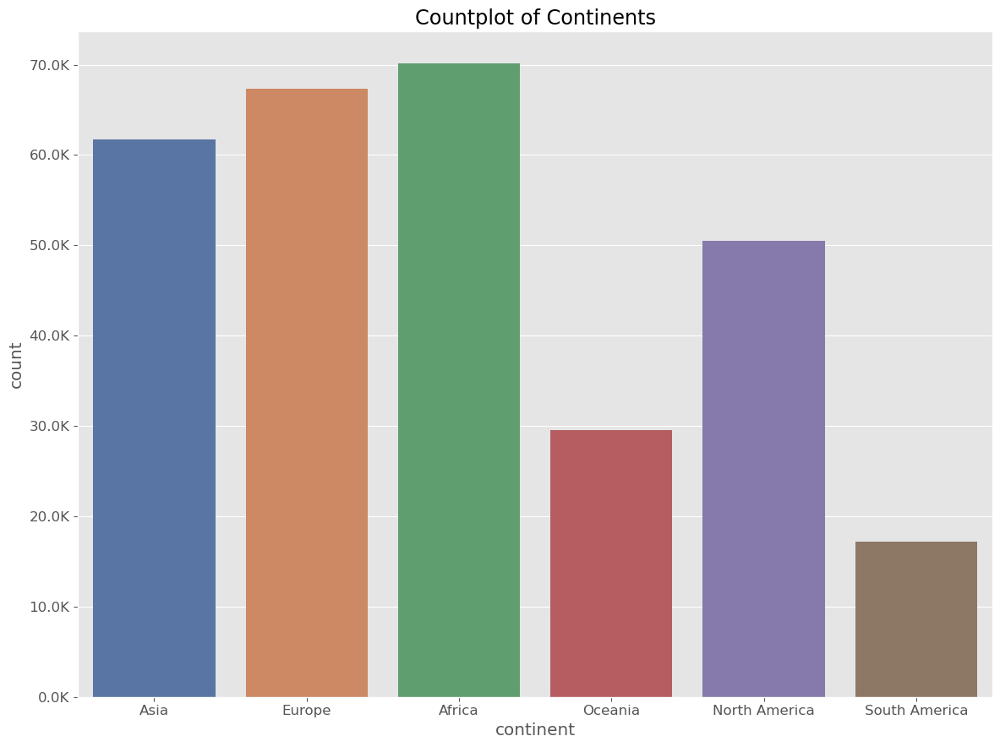

In [13]:
fig, ax = plt.subplots()

cntplot(data=df, x='continent', orient='v', palette='deep', dodge=True, ax=ax.yaxis.set_major_formatter(formatter=format_tsd))
ax.set(title='Countplot of Continents')

In [14]:
round(df['continent'].value_counts(True), 3)                              # calculate the relative frequencies for each continent                        

continent
Africa           0.237
Europe           0.227
Asia             0.208
North America    0.170
Oceania          0.100
South America    0.058
Name: proportion, dtype: float64

[Text(0.5, 1.0, 'Pie chart of the relative frequency for each continent')]

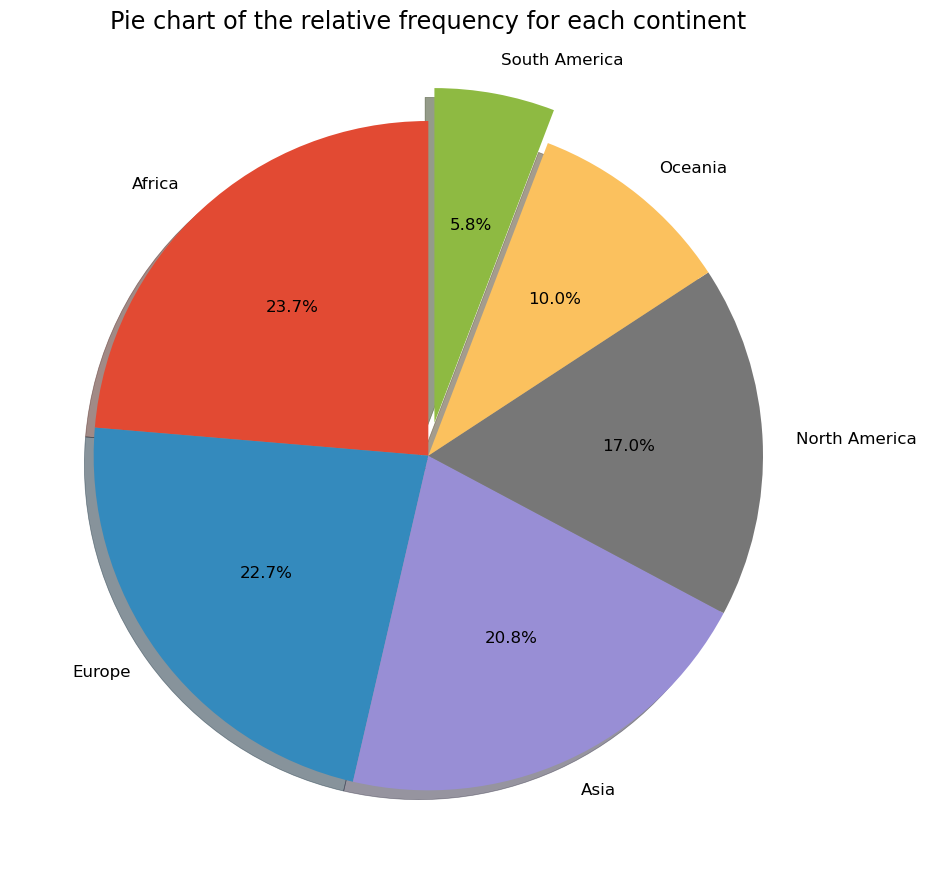

In [15]:
fig, ax = plt.subplots()

plot_pie(
  x=df['continent'].value_counts(True).values, labels=df['continent'].value_counts(True).keys(), autopct='%1.1f%%',
  shadow=True, startangle=90, normalize=True, explode=[0, 0, 0, 0, 0, 0.1]
)

ax.set(title='Pie chart of the relative frequency for each continent')

In [16]:
df['location'].value_counts().head(10)

location
Argentina        1233
Mexico           1233
Afghanistan      1231
Palau            1231
Nicaragua        1231
Niger            1231
Nigeria          1231
Niue             1231
North America    1231
North Korea      1231
Name: count, dtype: int64

In [17]:
df.describe(include='object')

,iso_code,continent,location,date,tests_units
count,311307,296535,311307,311307,106788
unique,255,6,255,1233,4
top,ARG,Africa,Argentina,2022-04-20,tests performed
freq,1233,70168,1233,255,80099


In [18]:
df['tests_units'].value_counts()

tests_units
tests performed    80099
people tested      16257
samples tested      9591
units unclear        841
Name: count, dtype: int64

<Axes: xlabel='continent', ylabel='count'>

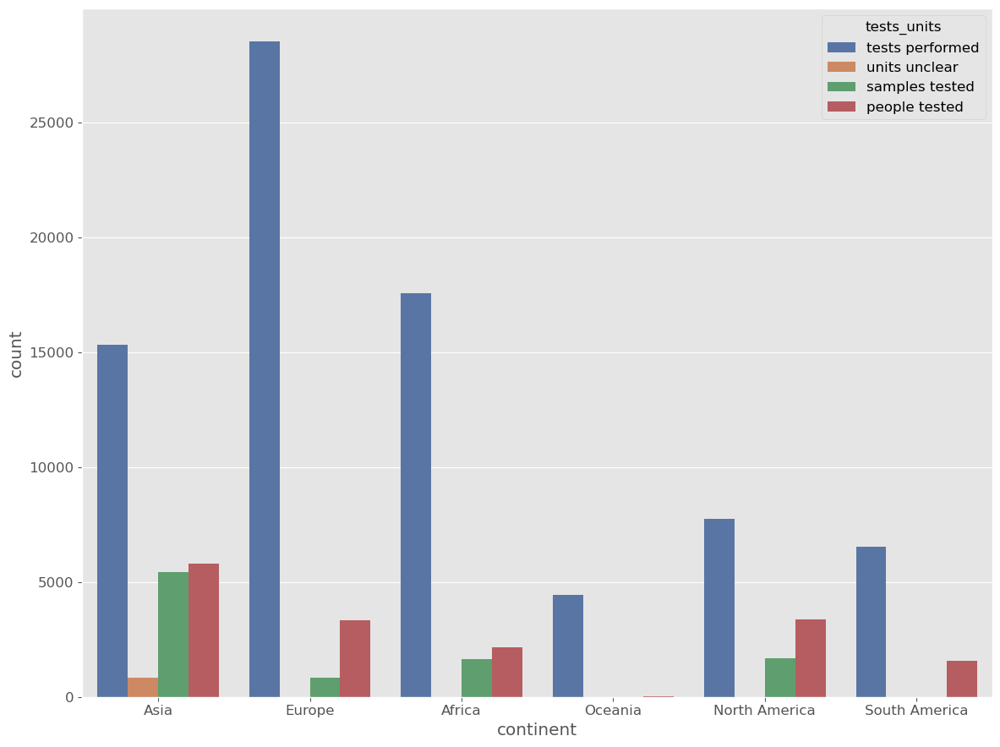

In [19]:
cntplot(data=df, orient='v', palette='deep', dodge=True, x='continent', hue='tests_units')

In [20]:
df.describe(include='float64')

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,2.75335e+05,3.02655e+05,3.01391e+05,2.54635e+05,302735.00000,301505.00000,275335.00000,302655.00000,301391.00000,254635.00000,302735.00000,301505.00000,184817.00000,35962.00000,35962.00000,36744.00000,36744.00000,9444.00000,9444.00000,21860.00000,21860.00000,7.93870e+04,7.54030e+04,79387.00000,75403.00000,1.03965e+05,103965.00000,95927.00000,9.43480e+04,7.48750e+04,7.17230e+04,6.94930e+04,4.35060e+04,6.16320e+04,1.67373e+05,74875.00000,71723.00000,69493.00000,43506.00000,167373.00000,1.67337e+05,167337.00000,197650.00000,264201.00000,245704.00000,237119.00000,243242.00000,240812.00000,155110.00000,241246.00000,253558.00000,180960.00000,178498.00000,118177.00000,212966.00000,286327.0000,233862.00000,3.11307e+05,1.06690e+04,10669.00000,10669.00000,10669.00000
mean,5.76716e+06,1.07340e+04,1.07768e+04,8.06166e+04,95.74095,96.10365,88010.37567,161.89045,162.52559,811.19407,1.01563,1.01943,0.91150,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,6.72854e+04,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559,42.66784,411.02413,30.50924,8.69971,5.49887,19013.72762,13.84810,264.28804,8.56109,10.79006,32.90965,50.78933,3.09701,73.7175,0.72247,1.28062e+08,4.73967e+04,9.53890,12.63355,1477.14968
std,3.60009e+07,1.03009e+05,1.00246e+05,4.16465e+05,600.70634,591.33425,138439.52014,1127.17160,634.54724,1053.77269,4.67601,2.91283,0.39992,2220.52969,23.34581,10239.78900,156.92034,540.20689,14.11690,11353.61327,90.72172,8.40987e+07,2.47734e+05,2195.42850,9.03384,1.13821e+06,7.30823,0.11598,3.34437e+04,1.42526e+09,6.33085e+08,5.74592e+08,3.23070e+08,3.40125e+06,2.07032e+06,83.98906,29.94169,29.51810,29.98236,3283.87778,8.42023e+05,0.18667,24.91724,1875.78580,9.08312,6.09290,4.13485,20001.22508,20.09163,120.92729,4.94134,10.77939,13.57467,31.95742,2.54838,7.3973,0.14899,6.59506e+08,1.38424e+05,12.91401,26.34422,1840.90784
min,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.2800,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160
25%,6.56500e+03,0.00000e+00,1.14

In [21]:
df['date'] = df['date'].astype('datetime64[ns]')                  # convert date to pandas datetime
df.select_dtypes(include='datetime')

,date
0,2020-01-03
1,2020-01-04
2,2020-01-05
3,2020-01-06
4,2020-01-07
...,...
311302,2023-05-13
311303,2023-05-14
311304,2023-05-15
311305,2023-05-16


In [22]:
df['day_name'] = df['date'].dt.day_name()                             # add name of the day
df['day'] = df['date'].dt.day                                         # day
df['month_num'] = df['date'].dt.month                                 # add month number
df['year'] =  df['date'].dt.year                                      # year

df[['year', 'month_num', 'day', 'day_name']]

,year,month_num,day,day_name
0,2020,1,3,Friday
1,2020,1,4,Saturday
2,2020,1,5,Sunday
3,2020,1,6,Monday
4,2020,1,7,Tuesday
...,...,...,...,...
311302,2023,5,13,Saturday
311303,2023,5,14,Sunday
311304,2023,5,15,Monday
311305,2023,5,16,Tuesday


In [23]:
# assign month names
df['month_name'] = df['month_num'].map(
                                       {
                                         1: 'Jan',
                                         2: 'Feb',
                                         3: 'Mar',
                                         4: 'Apr',
                                         5: 'May',
                                         6: 'June',
                                         7: 'July',
                                         8: 'Aug',
                                         9: 'Sep',
                                         10: 'Oct',
                                         11: 'Nov',
                                         12: 'Dec'
                                       }
                                    )

df[['month_num', 'month_name']].value_counts(ascending=False)

month_num  month_name
3          Mar           31346
1          Jan           30702
4          Apr           30366
2          Feb           28493
5          May           27786
7          July          23560
8          Aug           23560
10         Oct           23560
12         Dec           23534
6          June          22800
9          Sep           22800
11         Nov           22800
Name: count, dtype: int64

<Axes: xlabel='month_name', ylabel='count'>

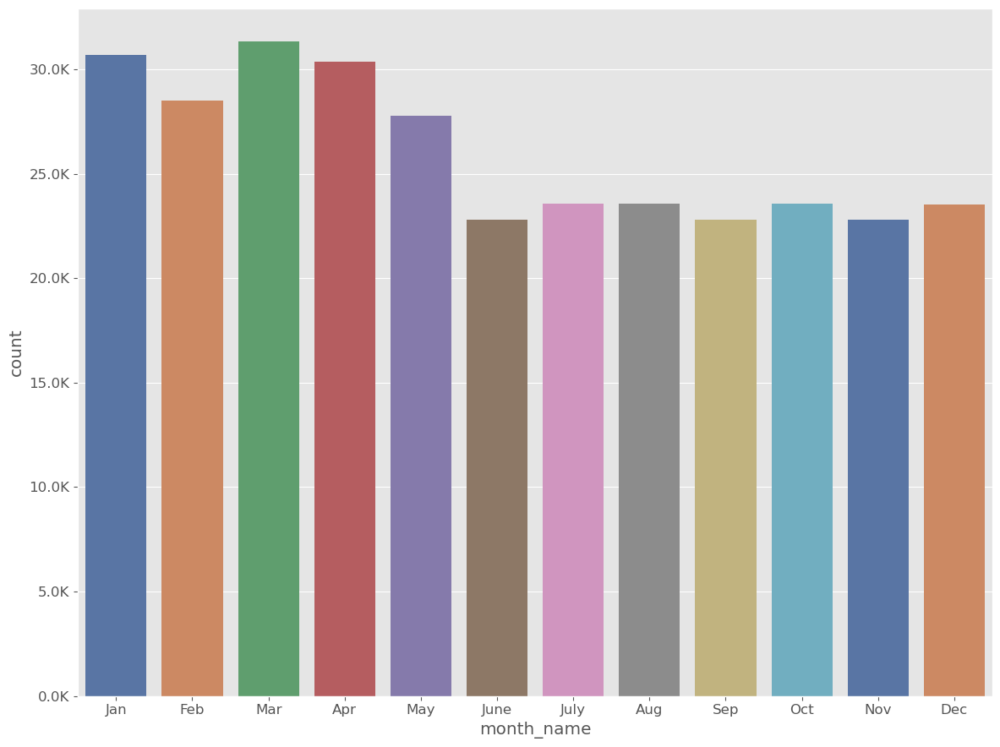

In [24]:
fig, ax = plt.subplots()

cntplot(data=df, x='month_name', palette='deep', orient='v', dodge=True, ax=ax.yaxis.set_major_formatter(formatter=format_tsd))

In [25]:
# change month name to categorical 
ordered_months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

df['month_name'] = pd.Categorical(df['month_name'], ordered_months)

df['month_name'].dtype

CategoricalDtype(categories=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug',
                  'Sep', 'Oct', 'Nov', 'Dec'],
, ordered=False)

# Missing Data Exploration

In [26]:
df.isna().sum()                                                              # over 50 % missing data in some columns

iso_code                                           0
continent                                      14772
location                                           0
date                                               0
total_cases                                    35972
new_cases                                       8652
new_cases_smoothed                              9916
total_deaths                                   56672
new_deaths                                      8572
new_deaths_smoothed                             9802
total_cases_per_million                        35972
new_cases_per_million                           8652
new_cases_smoothed_per_million                  9916
total_deaths_per_million                       56672
new_deaths_per_million                          8572
new_deaths_smoothed_per_million                 9802
reproduction_rate                             126490
icu_patients                                  275345
icu_patients_per_million                      

<Axes: >

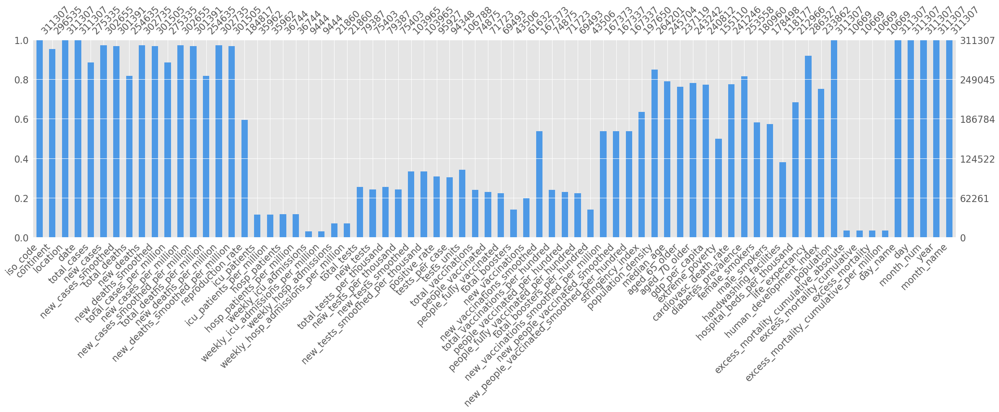

In [27]:
msno.bar(df, labels=True, color=(0.3, 0.6, 0.9))                              # plot missing values for each column

<Axes: >

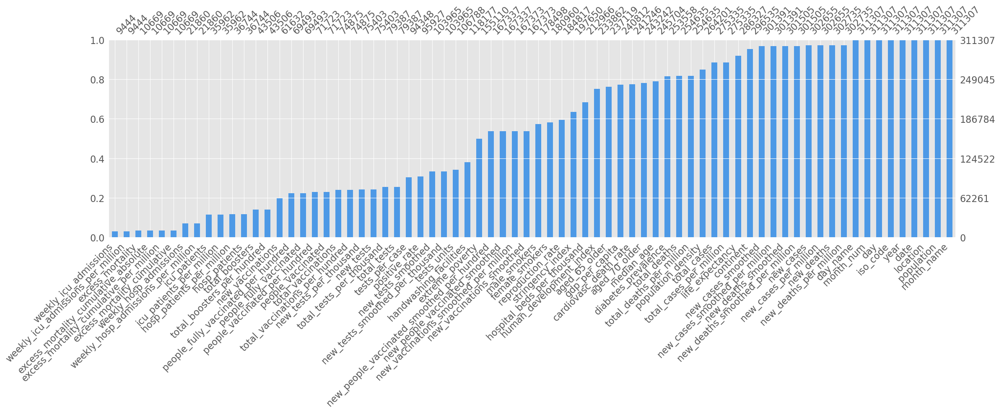

In [28]:
msno.bar(df, labels=True, color=(0.3, 0.6, 0.9), sort='ascending') 

In [29]:
# filter for missing values based on the column with the highest values missing
df.loc[df['weekly_icu_admissions'].isnull()]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day_name,day,month_num,year,month_name
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Friday,3,1,2020,Jan
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Saturday,4,1,2020,Jan
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Sunday,5,1,2020,Jan
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Monday,6,1,2020,Jan
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Tuesday,7,1,2020,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311302,ZWE,Africa,Zimbabwe,2023-05-13,264821.0,5.0,10.286,5690.0,1.0,0.429,16226.241,0.306,0.630,348.64,0.061,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN,Saturday,13,5,2023,May
311303,ZWE,Africa,Zimbabwe,2023-05-14,264841.0,20.0,10.714,5690.0,0.0,0.429,16227.467,1.225,0.656,348.64,0.000,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Common strategies that can be used to handle missing data for this project may include:
1) ignoring the missing data
2) dropping records with missing data
3) filling the missing data

In [30]:
# droping missing data based on rows containing missing values results in an empty dataframe   
df.dropna(axis='index')

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day_name,day,month_num,year,month_name


In [31]:
# dropping missing values based on columns also returns an a smaller dataframe as almost all columns contains a missing value
df.dropna(axis='columns')

,iso_code,location,date,population,day_name,day,month_num,year,month_name
0,AFG,Afghanistan,2020-01-03,41128772.0,Friday,3,1,2020,Jan
1,AFG,Afghanistan,2020-01-04,41128772.0,Saturday,4,1,2020,Jan
2,AFG,Afghanistan,2020-01-05,41128772.0,Sunday,5,1,2020,Jan
3,AFG,Afghanistan,2020-01-06,41128772.0,Monday,6,1,2020,Jan
4,AFG,Afghanistan,2020-01-07,41128772.0,Tuesday,7,1,2020,Jan
...,...,...,...,...,...,...,...,...,...
311302,ZWE,Zimbabwe,2023-05-13,16320539.0,Saturday,13,5,2023,May
311303,ZWE,Zimbabwe,2023-05-14,16320539.0,Sunday,14,5,2023,May
311304,ZWE,Zimbabwe,2023-05-15,16320539.0,Monday,15,5,2023,May
311305,ZWE,Zimbabwe,2023-05-16,16320539.0,Tuesday,16,5,2023,May


Filling the missing data

In [32]:
# filling missing values with a constant value will not be a good decision for instance in total cases or deaths that varies for different locations
df.loc[df['weekly_icu_admissions'].isnull()]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day_name,day,month_num,year,month_name
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Friday,3,1,2020,Jan
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Saturday,4,1,2020,Jan
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Sunday,5,1,2020,Jan
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Monday,6,1,2020,Jan
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN,Tuesday,7,1,2020,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311302,ZWE,Africa,Zimbabwe,2023-05-13,264821.0,5.0,10.286,5690.0,1.0,0.429,16226.241,0.306,0.630,348.64,0.061,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN,Saturday,13,5,2023,May
311303,ZWE,Africa,Zimbabwe,2023-05-14,264841.0,20.0,10.714,5690.0,0.0,0.429,16227.467,1.225,0.656,348.64,0.000,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [33]:
df.describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day,month_num,year
count,311307,2.75335e+05,3.02655e+05,3.01391e+05,2.54635e+05,302735.00000,301505.00000,275335.00000,302655.00000,301391.00000,254635.00000,302735.00000,301505.00000,184817.00000,35962.00000,35962.00000,36744.00000,36744.00000,9444.00000,9444.00000,21860.00000,21860.00000,7.93870e+04,7.54030e+04,79387.00000,75403.00000,1.03965e+05,103965.00000,95927.00000,9.43480e+04,7.48750e+04,7.17230e+04,6.94930e+04,4.35060e+04,6.16320e+04,1.67373e+05,74875.00000,71723.00000,69493.00000,43506.00000,167373.00000,1.67337e+05,167337.00000,197650.00000,264201.00000,245704.00000,237119.00000,243242.00000,240812.00000,155110.00000,241246.00000,253558.00000,180960.00000,178498.00000,118177.00000,212966.00000,286327.0000,233862.00000,3.11307e+05,1.06690e+04,10669.00000,10669.00000,10669.00000,311307.00000,311307.00000,311307.00000
mean,2021-09-10 04:30:55.768100352,5.76716e+06,1.07340e+04,1.07768e+04,8.06166e+04,95.74095,96.10365,88010.37567,161.89045,162.52559,811.19407,1.01563,1.01943,0.91150,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,6.72854e+04,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559,42.66784,411.02413,30.50924,8.69971,5.49887,19013.72762,13.84810,264.28804,8.56109,10.79006,32.90965,50.78933,3.09701,73.7175,0.72247,1.28062e+08,4.73967e+04,9.53890,12.63355,1477.14968,15.64401,6.12363,2021.22616
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.2800,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160,1.00000,1.00000,2020.00000
25%,2020-11-08 00:00:00,6.56500e+03,0.00000e+00,1.14300e+00,1.21000e+02,0.00000,0.00000,2039.08200,0.00000,0.24600,50.39850,0.00000,0.00000,0.72000,24.00000,2.90900,230.00000,37.06000,28.00000,2.37300,280.00000,29.07450,3.64654e+05,2.24400e+03,43.58550,0.28600,1.48600e+03,0.20300,0.01700,7.10000e+00,1.47132e+06,8.54464e+05,7.50131e+05,3.38956e+05,3.11800e+03,3.88000e+02,34.90500,23.60000,16.85000,3.49000,180.00000,7.30000e+01,0.00300,22.12000,37.72800,22.20000,3.52600,2.08500,3823.19

Forward Fill & Back Fill within Groups

In [34]:
df.loc[df['weekly_icu_admissions'].isnull()].fillna(df.groupby(['location']).transform('ffill')).describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day,month_num,year
count,301863,2.65901e+05,2.93381e+05,2.92153e+05,2.45496e+05,293381.00000,292153.00000,265901.00000,293381.00000,292153.00000,245496.00000,293381.00000,292153.00000,201710.00000,37374.00000,37374.00000,36752.00000,36752.00000,11883.00000,11883.00000,26833.00000,26833.00000,1.63654e+05,1.45149e+05,163654.00000,145149.00000,1.62413e+05,162413.00000,154247.00000,1.53612e+05,1.84343e+05,1.83587e+05,1.73920e+05,1.07338e+05,1.41498e+05,1.84132e+05,184343.00000,183587.00000,173920.00000,107338.00000,184132.00000,1.83376e+05,183376.00000,217794.00000,254757.00000,236260.00000,227675.00000,233798.00000,231368.00000,149643.00000,231802.00000,244114.00000,171516.00000,169054.00000,118177.00000,203522.00000,276883.00000,224418.00000,3.01863e+05,1.39425e+05,139425.00000,139425.00000,139425.00000,301863.00000,301863.00000,301863.00000
mean,2021-09-07 16:17:27.574561792,5.72645e+06,1.05999e+04,1.06401e+04,8.14445e+04,96.75470,97.09128,83634.49468,153.62562,153.73748,776.21663,0.98155,0.98220,0.84988,543.56925,14.31152,3546.49518,135.72641,44.11260,10.08819,2965.20329,84.75452,4.33258e+07,4.19155e+04,1152.53711,2.97763,1.30656e+05,2.45612,0.11271,1.55996e+03,1.63472e+08,7.40162e+07,6.72886e+07,4.27248e+07,3.92197e+05,2.94726e+05,103.47369,47.30558,43.31444,27.28914,2028.44110,1.09538e+05,0.07912,38.70472,417.26152,30.07769,8.33490,5.25084,18289.17285,14.31717,269.43155,8.64391,9.97163,32.80961,50.78933,3.03765,73.44595,0.71484,1.31086e+08,4.18113e+04,11.01166,14.87760,1489.83612,15.64102,6.11629,2021.21991
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.28000,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160,1.00000,1.00000,2020.00000
25%,2020-11-03 00:00:00,6.12000e+03,0.00000e+00,8.57000e-01,1.13000e+02,0.00000,0.00000,1863.40300,0.00000,0.19700,47.14875,0.00000,0.00000,0.63000,15.00000,2.26200,200.00000,34.81875,2.00000,1.29800,67.00000,19.87400,2.74190e+05,1.21700e+03,49.85550,0.20600,7.17000e+02,0.13800,0.01500,6.10000e+00,2.45039e+05,1.57580e+05,1.28250e+05,4.47400e+04,1.17100e+03,1.96000e+02,27.78000,19.46500,15.85750,3.82000,135.00000,3.40000e+01,0.00200,13.89000,37.72800,22.00000,3.46600,2.

In [35]:
df.loc[df['weekly_icu_admissions'].isnull()].fillna(df.groupby(['location']).transform('bfill')).describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day,month_num,year
count,301863,2.90923e+05,2.93282e+05,2.93282e+05,2.82306e+05,293336.00000,293336.00000,290923.00000,293282.00000,293282.00000,282306.00000,293336.00000,293336.00000,205415.00000,39706.00000,39706.00000,39426.00000,39426.00000,16884.00000,16884.00000,32565.00000,32565.00000,1.54601e+05,1.21676e+05,154601.00000,121676.00000,1.51185e+05,151185.00000,145352.00000,1.44083e+05,2.54526e+05,2.55183e+05,2.54985e+05,2.33684e+05,1.62513e+05,2.54472e+05,254526.00000,255183.00000,254985.00000,233684.00000,254472.00000,2.55129e+05,255129.00000,189380.00000,254757.00000,236260.00000,227675.00000,233798.00000,231368.00000,149643.00000,231802.00000,244114.00000,171516.00000,169054.00000,118177.00000,203522.00000,276883.00000,224418.00000,3.01863e+05,1.14500e+05,114500.00000,114500.00000,114500.00000,301863.00000,301863.00000,301863.00000
mean,2021-09-07 16:17:27.574561792,5.23393e+06,1.06017e+04,1.05986e+04,7.08258e+04,96.74101,96.69358,76727.74033,153.63795,153.13111,679.04431,0.98082,0.97813,0.97611,582.41125,15.09921,3901.98478,134.84069,96.69065,9.29047,3053.17995,77.65209,4.73888e+07,4.45966e+04,755.82430,4.01775,9.86566e+04,2.87564,0.10230,1.81647e+03,1.15271e+08,5.35331e+07,4.66361e+07,1.93695e+07,3.46459e+05,2.14780e+05,63.82396,29.97900,26.14684,15.40806,2291.88467,9.29299e+04,0.14696,42.62239,417.26152,30.07769,8.33490,5.25084,18289.17285,14.31717,269.43155,8.64391,9.97163,32.80961,50.78933,3.03765,73.44595,0.71484,1.31086e+08,4.13379e+04,9.79806,14.17065,1359.59801,15.64102,6.11629,2021.21991
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.28000,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160,1.00000,1.00000,2020.00000
25%,2020-11-03 00:00:00,2.38500e+03,0.00000e+00,8.57000e-01,3.40000e+01,0.00000,0.00000,940.64850,0.00000,0.18100,20.97300,0.00000,0.00000,0.72000,16.00000,2.47425,192.00000,33.14300,4.00000,1.52300,61.00000,20.40600,1.23837e+05,6.72000e+02,19.00600,0.18900,5.20000e+02,0.10200,0.01230,7.30000e+00,1.29100e+03,2.00000e+03,5.32100e+03,4.26700e+03,6.77000e+02,2.14000e+02,0.03000,0.05000,0.18000,0.12000,80.00000,9.20000e+01,0.00300,22.22000,37.72800,22.00000,3.46600,2.06300,368

In [36]:
df.describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day,month_num,year
count,311307,2.75335e+05,3.02655e+05,3.01391e+05,2.54635e+05,302735.00000,301505.00000,275335.00000,302655.00000,301391.00000,254635.00000,302735.00000,301505.00000,184817.00000,35962.00000,35962.00000,36744.00000,36744.00000,9444.00000,9444.00000,21860.00000,21860.00000,7.93870e+04,7.54030e+04,79387.00000,75403.00000,1.03965e+05,103965.00000,95927.00000,9.43480e+04,7.48750e+04,7.17230e+04,6.94930e+04,4.35060e+04,6.16320e+04,1.67373e+05,74875.00000,71723.00000,69493.00000,43506.00000,167373.00000,1.67337e+05,167337.00000,197650.00000,264201.00000,245704.00000,237119.00000,243242.00000,240812.00000,155110.00000,241246.00000,253558.00000,180960.00000,178498.00000,118177.00000,212966.00000,286327.0000,233862.00000,3.11307e+05,1.06690e+04,10669.00000,10669.00000,10669.00000,311307.00000,311307.00000,311307.00000
mean,2021-09-10 04:30:55.768100352,5.76716e+06,1.07340e+04,1.07768e+04,8.06166e+04,95.74095,96.10365,88010.37567,161.89045,162.52559,811.19407,1.01563,1.01943,0.91150,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,6.72854e+04,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559,42.66784,411.02413,30.50924,8.69971,5.49887,19013.72762,13.84810,264.28804,8.56109,10.79006,32.90965,50.78933,3.09701,73.7175,0.72247,1.28062e+08,4.73967e+04,9.53890,12.63355,1477.14968,15.64401,6.12363,2021.22616
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.2800,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160,1.00000,1.00000,2020.00000
25%,2020-11-08 00:00:00,6.56500e+03,0.00000e+00,1.14300e+00,1.21000e+02,0.00000,0.00000,2039.08200,0.00000,0.24600,50.39850,0.00000,0.00000,0.72000,24.00000,2.90900,230.00000,37.06000,28.00000,2.37300,280.00000,29.07450,3.64654e+05,2.24400e+03,43.58550,0.28600,1.48600e+03,0.20300,0.01700,7.10000e+00,1.47132e+06,8.54464e+05,7.50131e+05,3.38956e+05,3.11800e+03,3.88000e+02,34.90500,23.60000,16.85000,3.49000,180.00000,7.30000e+01,0.00300,22.12000,37.72800,22.20000,3.52600,2.08500,3823.19

Combining FFill and BFill

In [37]:
df.loc[df['weekly_icu_admissions'].isnull()].fillna(df.groupby(['location']).transform('ffill').transform('backfill')).describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day,month_num,year
count,301863,3.01863e+05,3.01863e+05,3.01863e+05,3.01863e+05,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,295707.00000,295707.00000,295707.00000,295707.00000,253983.00000,253983.00000,295707.00000,295707.00000,3.01863e+05,3.01863e+05,301863.00000,301863.00000,3.01863e+05,301863.00000,301863.00000,3.01863e+05,3.01863e+05,3.01863e+05,3.01863e+05,3.01863e+05,3.01863e+05,3.01863e+05,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,3.01863e+05,301863.00000,301863.00000,301863.00000,301863.0000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,301863.00000,3.01863e+05,2.89648e+05,289648.00000,289648.00000,289648.00000,301863.00000,301863.00000,301863.00000
mean,2021-09-07 16:17:27.574561792,5.04424e+06,1.03020e+04,1.02979e+04,6.62378e+04,94.03601,93.96816,73947.67670,149.30892,148.79229,637.73512,0.95397,0.95060,1.04852,362.16804,13.94170,2112.77731,66.94495,200.44693,9.83120,3492.09187,85.35204,2.41339e+07,3.68507e+04,868.76299,3.34786,7.87071e+04,2.74531,0.10067,9.58083e+02,9.98549e+07,4.61422e+07,4.03474e+07,1.58492e+07,1.95893e+05,1.82202e+05,64.02575,29.71544,26.05147,15.35180,2150.98803,7.89544e+04,0.13744,27.92544,370.84029,30.2458,8.31589,5.28288,19123.27443,12.46936,264.49835,8.81854,10.65310,32.18573,50.55857,3.15449,73.69919,0.72545,1.31086e+08,2.00351e+04,2.28072,4.14191,699.88815,15.64102,6.11629,2021.21991
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.1000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.28000,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160,1.00000,1.00000,2020.00000
25%,2020-11-03 00:00:00,1.26450e+03,0.00000e+00,4.29000e-01,1.30000e+01,0.00000,0.00000,613.95150,0.00000,0.08100,15.54300,0.00000,0.00000,0.73000,6.00000,1.09800,32.00000,6.37100,4.00000,0.71000,87.00000,10.32100,2.29300e+04,2.11000e+02,7.32400,0.02900,2.21000e+02,0.04200,0.00960,7.80000e+00,6.41000e+02,1.20200e+03,3.53100e+03,3.64600e+03,4.14000e+02,1.73000e+02,0.01000,0.02000,0.16000,0.16000,62.00000,6.80000e+01,0.00200,0.00000,41.28500,22.4000,3.46600,2.08500,5034.

In [38]:
df.describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day,month_num,year
count,311307,2.75335e+05,3.02655e+05,3.01391e+05,2.54635e+05,302735.00000,301505.00000,275335.00000,302655.00000,301391.00000,254635.00000,302735.00000,301505.00000,184817.00000,35962.00000,35962.00000,36744.00000,36744.00000,9444.00000,9444.00000,21860.00000,21860.00000,7.93870e+04,7.54030e+04,79387.00000,75403.00000,1.03965e+05,103965.00000,95927.00000,9.43480e+04,7.48750e+04,7.17230e+04,6.94930e+04,4.35060e+04,6.16320e+04,1.67373e+05,74875.00000,71723.00000,69493.00000,43506.00000,167373.00000,1.67337e+05,167337.00000,197650.00000,264201.00000,245704.00000,237119.00000,243242.00000,240812.00000,155110.00000,241246.00000,253558.00000,180960.00000,178498.00000,118177.00000,212966.00000,286327.0000,233862.00000,3.11307e+05,1.06690e+04,10669.00000,10669.00000,10669.00000,311307.00000,311307.00000,311307.00000
mean,2021-09-10 04:30:55.768100352,5.76716e+06,1.07340e+04,1.07768e+04,8.06166e+04,95.74095,96.10365,88010.37567,161.89045,162.52559,811.19407,1.01563,1.01943,0.91150,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,6.72854e+04,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559,42.66784,411.02413,30.50924,8.69971,5.49887,19013.72762,13.84810,264.28804,8.56109,10.79006,32.90965,50.78933,3.09701,73.7175,0.72247,1.28062e+08,4.73967e+04,9.53890,12.63355,1477.14968,15.64401,6.12363,2021.22616
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.2800,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160,1.00000,1.00000,2020.00000
25%,2020-11-08 00:00:00,6.56500e+03,0.00000e+00,1.14300e+00,1.21000e+02,0.00000,0.00000,2039.08200,0.00000,0.24600,50.39850,0.00000,0.00000,0.72000,24.00000,2.90900,230.00000,37.06000,28.00000,2.37300,280.00000,29.07450,3.64654e+05,2.24400e+03,43.58550,0.28600,1.48600e+03,0.20300,0.01700,7.10000e+00,1.47132e+06,8.54464e+05,7.50131e+05,3.38956e+05,3.11800e+03,3.88000e+02,34.90500,23.60000,16.85000,3.49000,180.00000,7.30000e+01,0.00300,22.12000,37.72800,22.20000,3.52600,2.08500,3823.19

In [39]:
# the best approach to fill missing values for this project is to group based on each location, and fill values with the means of each column
df_filled = df.groupby('location').fillna(df.select_dtypes(np.number).mean())
df_filled.head()

,iso_code,continent,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day_name,day,month_num,year,month_name
0,AFG,Asia,2020-01-03,5.76716e+06,0.0,10776.78066,80616.61459,0.0,96.10365,88010.37567,0.0,162.52559,811.19407,0.0,1.01943,0.9115,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,67285.41212,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,0.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,41128772.0,47396.67985,9.5389,12.63355,1477.14968,Friday,3,1,2020,Jan
1,AFG,Asia,2020-01-04,5.76716e+06,0.0,10776.78066,80616.61459,0.0,96.10365,88010.37567,0.0,162.52559,811.19407,0.0,1.01943,0.9115,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,67285.41212,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,0.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,41128772.0,47396.67985,9.5389,12.63355,1477.14968,Saturday,4,1,2020,Jan
2,AFG,Asia,2020-01-05,5.76716e+06,0.0,10776.78066,80616.61459,0.0,96.10365,88010.37567,0.0,162.52559,811.19407,0.0,1.01943,0.9115,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,67285.41212,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,0.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,41128772.0,47396.67985,9.5389,12.63355,1477.14968,Sunday,5,1,2020,Jan
3,AFG,Asia,2020-01-06,5.76716e+06,0.0,10776.78066,80616.61459,0.0,96.10365,88010.37567,0.0,162.52559,811.19407,0.0,1.01943,0.9115,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,67285.41212,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,0.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,41128772.0,47396.67985,9.5389,12.63355,1477.14968,Monday,6,1,2020,Jan
4,AFG,Asia,2020-01-07,5.76716e+06,0.0,10776.78066,80616.61459,0.0,96.10365,88010.37567,0.0,162.52559,811.19407,0.0,1.01943,0.9115,701.54318,16.95696,4

<Axes: >

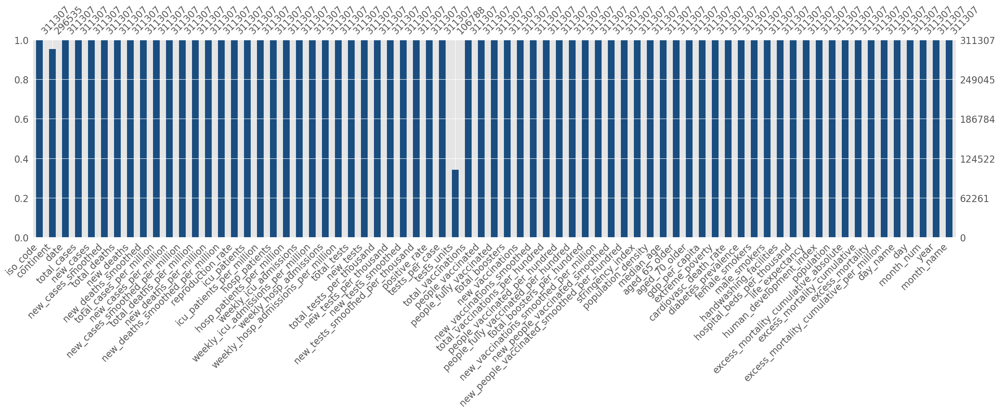

In [40]:
msno.bar(df_filled, labels=True, color=(0.1, 0.3, 0.5))

<Axes: >

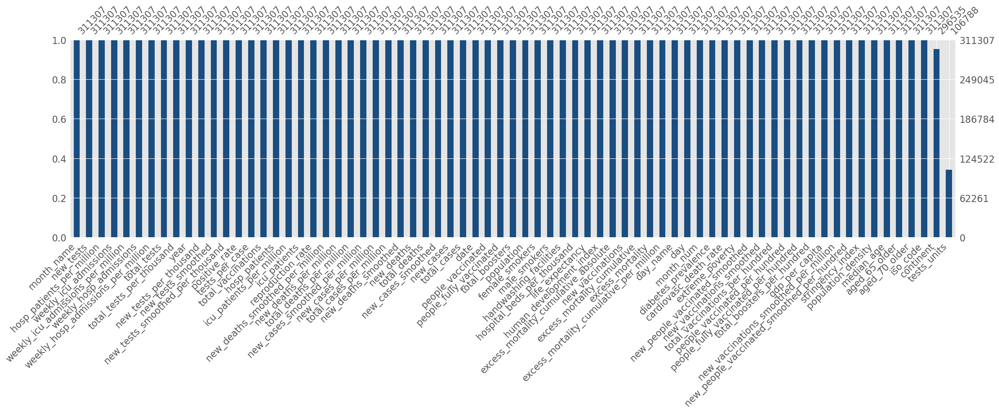

In [41]:
msno.bar(df_filled, labels=True, color=(0.1, 0.3, 0.5), sort='descending')

In [42]:
df_filled.drop(columns=['day', 'month_num', 'year']).describe()

,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,311307,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,3.11307e+05,3.11307e+05,311307.00000,311307.00000,3.11307e+05,311307.00000,311307.00000,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,3.11307e+05,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,3.11307e+05,3.11307e+05,311307.00000,311307.00000,311307.00000
mean,2021-09-10 04:30:55.768100352,5.76716e+06,1.07340e+04,1.07768e+04,8.06166e+04,95.74095,96.10365,88010.37567,161.89045,162.52559,811.19407,1.01563,1.01943,0.91150,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,6.72854e+04,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559,42.66784,411.02413,30.50924,8.69971,5.49887,19013.72762,13.84810,264.28804,8.56109,10.79006,32.90965,50.78933,3.09701,73.71750,0.72247,1.28062e+08,4.73967e+04,9.53890,12.63355,1477.14968
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.07000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,1.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000,0.00000,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.28000,0.39400,4.70000e+01,-3.77261e+04,-44.23000,-95.92000,-1984.28160
25%,2020-11-08 00:00:00,8.99800e+03,0.00000e+00,1.28600e+00,1.75000e+02,0.00000,0.00000,2753.63100,0.00000,0.30500,76.60050,0.00000,0.00000,0.89000,701.54318,16.95696,4088.69815,139.38274,365.01472,11.05184,4498.61798,91.31134,2.11046e+07,6.72854e+04,924.25476,3.27247,3.18395e+04,2.56850,0.09816,9.09000e+01,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.46900e+03,114.50535,50.84334,45.97845,32.78559,696.00000,8.14000e+02,0.01600,35.19000,46.75400,24.90000,4.27700,2.39200,6222.55400,2.50000,199.94100,5.81000,5.10000,30.00000,50.78933,1.71000,70.39000,0.66500

# Compute Pairwise Correlation

In [43]:
cor_mat = df_filled.select_dtypes(np.number).corr()
cor_mat

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,day,month_num,year
total_cases,1.00000,0.48453,0.50752,0.93274,0.37444,0.38528,0.07662,0.00447,0.00884,0.10365,-4.03684e-03,-0.00593,0.01190,0.04506,-0.00438,6.00712e-02,-7.54210e-04,9.76936e-03,-6.82805e-03,6.07203e-02,0.00231,0.07081,0.04706,0.00746,0.00070,0.00754,0.00152,0.00312,-0.00146,0.81663,0.80415,0.80885,0.82729,0.31253,0.35971,0.15842,0.15379,0.14579,0.02747,-0.03423,2.75318e-01,-0.04181,-0.02140,-5.65511e-03,0.03166,0.03052,0.02906,1.51884e-02,-0.02847,-0.02985,2.28786e-03,8.29851e-04,0.00206,2.38611e-02,1.11246e-02,0.01430,0.03430,0.63061,0.03514,0.00249,-0.00185,0.00763,-1.13857e-03,-1.16722e-02,1.14010e-01
new_cases,0.48453,1.00000,0.95228,0.52985,0.49236,0.47939,0.01193,0.05255,0.07443,0.03445,2.35432e-02,0.03237,0.01952,0.06821,0.01910,7.64666e-02,1.74820e-02,2.79510e-02,9.38294e-03,7.84771e-02,0.03270,0.05621,0.06581,0.00899,0.00809,0.01158,0.01037,0.02084,-0.00181,0.44907,0.44483,0.43752,0.37591,0.34086,0.37382,0.06166,0.05221,0.04895,-0.03267,0.01187,2.74331e-01,-0.01334,0.00639,-3.24291e-03,0.02649,0.02519,0.02388,1.24689e-02,-0.02095,-0.02450,-2.82829e-03,-3.00026e-03,0.00550,1.49186e-02,1.10820e-02,0.01331,0.02559,0.44312,0.01801,0.00155,0.00310,0.00157,6.76851e-03,1.53164e-03,3.54737e-02
new_cases_smoothed,0.50752,0.95228,1.00000,0.54792,0.50549,0.50377,0.01371,0.04306,0.07790,0.03611,2.24605e-02,0.03473,0.01752,0.07064,0.02004,7.94172e-02,1.86510e-02,2.89036e-02,9.84677e-03,8.10736e-02,0.03412,0.05833,0.06714,0.00937,0.00787,0.01185,0.01039,0.02185,-0.00188,0.46464,0.45976,0.45250,0.39157,0.34487,0.38041,0.06418,0.05410,0.05072,-0.03205,0.01093,2.79076e-01,-0.01414,0.00553,-3.33921e-03,0.02728,0.02594,0.02459,1.28312e-02,-0.02157,-0.02523,-2.91254e-03,-3.09763e-03,0.00566,1.53725e-02,1.14006e-02,0.01370,0.02634,0.45622,0.01798,0.00198,0.00313,0.00259,6.45283e-03,-3.58644e-03,3.81407e-02
total_deaths,0.93274,0.52985,0.54792,1.00000,0.55009,0.56441,0.02717,-0.00037,-0.00056,0.11744,1.87946e-03,0.00374,0.01752,0.06348,0.00470,7.26881e-02,9.87860e-04,9.24392e-03,-2.11203e-03,7.51195e-02,0.00705,0.08357,0.06073,0.00216,-0.00178,0.00953,-0.00156,0.00212,-0.00205,0.81018,0.82132,0.80774,0.73664,0.49078,0.54242,0.10522,0.11437,0.09409,-0.06290,-0.00291,4.53353e-01,-0.01760,-0.01593,-7.68175e-03,0.02470,0.02077,0.01899,4.76300e-03,-0.03460,-0.02516,9.94554e-03,-5.69116e-03,-0.00040,3.19724e-02,-1.88995e-03,0.00947,0.03078,0.72317,0.04673,0.01009,-0.00080,0.01225,-5.69941e-04,-5.42508e-03,7.67238e-02
new_deaths,0.37444,0.49236,0.50549,0.55009,1.00000,0.98159,-0.04056,0.00995,0.01547,0.01305,8.76636e-02,0.10815,0.02430,0.11764,0.04375,1.15132e-01,3.04629e-02,2.46606e-02,1.42923e-02

In [44]:
cor_mat['total_deaths'].sort_values(ascending=False)

total_deaths                                  1.00000
total_cases                                   0.93274
people_vaccinated                             0.82132
total_vaccinations                            0.81018
people_fully_vaccinated                       0.80774
total_boosters                                0.73664
population                                    0.72317
new_deaths_smoothed                           0.56441
new_deaths                                    0.55009
new_cases_smoothed                            0.54792
new_vaccinations_smoothed                     0.54242
new_cases                                     0.52985
new_vaccinations                              0.49078
new_people_vaccinated_smoothed                0.45335
total_deaths_per_million                      0.11744
people_vaccinated_per_hundred                 0.11437
total_vaccinations_per_hundred                0.10522
people_fully_vaccinated_per_hundred           0.09409
total_tests                 

<Axes: >

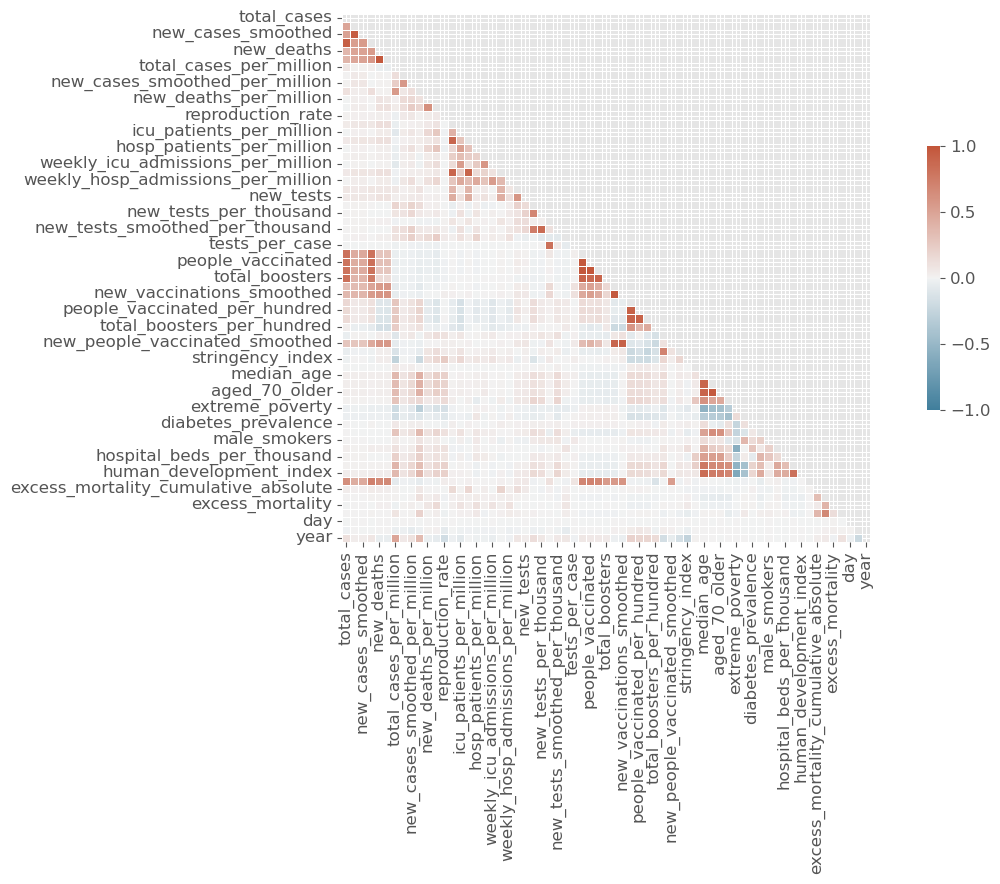

In [45]:
mask = np.triu(np.ones_like(cor_mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(cor_mat, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={'shrink': .5})

# Check Duplicates

In [46]:
df_filled.duplicated().sum()

0

# Exploratory Data Analysis

Create helper functions to visualize datasets

In [47]:
def plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs):
    '''
    Plots bar chart

    '''
    fig, ax = plt.subplots(figsize=(20, 10))
    fig.autofmt_xdate()

    sns.barplot(
        data=data,
        x=x, y=y, 
        hue=hue, ci=ci, color=color, 
        hue_order=hue_order, order=order, palette=palette,
        ax=ax,
        **kwargs
      )

    ax.set(title=title, xlabel=xlabel, ylabel=ylabel)

    ax.yaxis.set_major_formatter(formatter=formatter)

    return plot_bar



def plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs):
    '''
    Plots line chart

    '''
    fig, ax = plt.subplots(figsize=(20, 10))
    fig.autofmt_xdate()

    # plot line chart
    sns.lineplot(
        data=data, 
        x=x, y=y, 
        hue=hue, size=size, markers=markers, style=style, ci=ci,
        hue_order=hue_order, palette=palette,
        ax=ax,
        **kwargs
      )


    ax.set(title=title, xlabel=xlabel, ylabel=ylabel)

    ax.yaxis.set_major_formatter(formatter=formatter)

    return plot_line


def get_data(data, before=None, after=None, rule=None):
    '''
    Helper function to get specific date range

    '''
    return data.set_index('date').sort_index(ascending=True, axis='index').truncate(before, after).resample(rule)



def plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs):
    '''
    Helper function to plot line chart

    '''
    fig, ax = plt.subplots(figsize=(20, 10))
    fig.autofmt_xdate()

    sns.lineplot(
        data=data,
        x=x, y=y,
        ci=None, 
        hue=hue, hue_order=hue_order, palette=palette,
        ax=ax,
        **kwargs
    )

    ax.set(title=title, xlabel=xlabel, ylabel=ylabel)

    ax.set_xlim([data.index.min(), data.index.max()])

    ax.yaxis.set_major_formatter(formatter=formatter)

    return plot_date_rng

# Cases Exploration

In [48]:
cases_cols = ['iso_code', 'continent', 'date', 'total_cases', 'new_cases', 'new_cases_smoothed', 'total_cases_per_million',\
              'new_cases_per_million', 'new_cases_smoothed_per_million', 'year', 'month_num', 'month_name', 'day', 'day_name']

df_cases = df_filled[cases_cols] 
df_cases.head()

,iso_code,continent,date,total_cases,new_cases,new_cases_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,year,month_num,month_name,day,day_name
0,AFG,Asia,2020-01-03,5.76716e+06,0.0,10776.78066,88010.37567,0.0,162.52559,2020,1,Jan,3,Friday
1,AFG,Asia,2020-01-04,5.76716e+06,0.0,10776.78066,88010.37567,0.0,162.52559,2020,1,Jan,4,Saturday
2,AFG,Asia,2020-01-05,5.76716e+06,0.0,10776.78066,88010.37567,0.0,162.52559,2020,1,Jan,5,Sunday
3,AFG,Asia,2020-01-06,5.76716e+06,0.0,10776.78066,88010.37567,0.0,162.52559,2020,1,Jan,6,Monday
4,AFG,Asia,2020-01-07,5.76716e+06,0.0,10776.78066,88010.37567,0.0,162.52559,2020,1,Jan,7,Tuesday


In [49]:
df_cases.drop(columns=['year', 'month_num', 'day', 'day_name']).describe()

,date,total_cases,new_cases,new_cases_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million
count,311307,3.11307e+05,3.11307e+05,3.11307e+05,311307.00000,311307.00000,311307.00000
mean,2021-09-10 04:30:55.768100352,5.76716e+06,1.07340e+04,1.07768e+04,88010.37567,161.89045,162.52559
min,2020-01-01 00:00:00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000
25%,2020-11-08 00:00:00,8.99800e+03,0.00000e+00,1.28600e+00,2753.63100,0.00000,0.30500
50%,2021-09-11 00:00:00,1.15442e+05,2.10000e+01,4.51430e+01,33956.29200,3.10300,12.75800
75%,2022-07-14 00:00:00,1.80046e+06,6.81000e+02,8.37714e+02,90741.79100,84.51250,126.07300
max,2023-05-17 00:00:00,7.66440e+08,7.46082e+06,6.41067e+06,737554.50600,228872.02500,37241.78100
std,NaN,3.38571e+07,1.01567e+05,9.86360e+04,130195.58632,1111.39772,624.35937


In [50]:
df_cases.isna().sum()                                   # check missing values

iso_code                              0
continent                         14772
date                                  0
total_cases                           0
new_cases                             0
new_cases_smoothed                    0
total_cases_per_million               0
new_cases_per_million                 0
new_cases_smoothed_per_million        0
year                                  0
month_num                             0
month_name                            0
day                                   0
day_name                              0
dtype: int64

<Axes: >

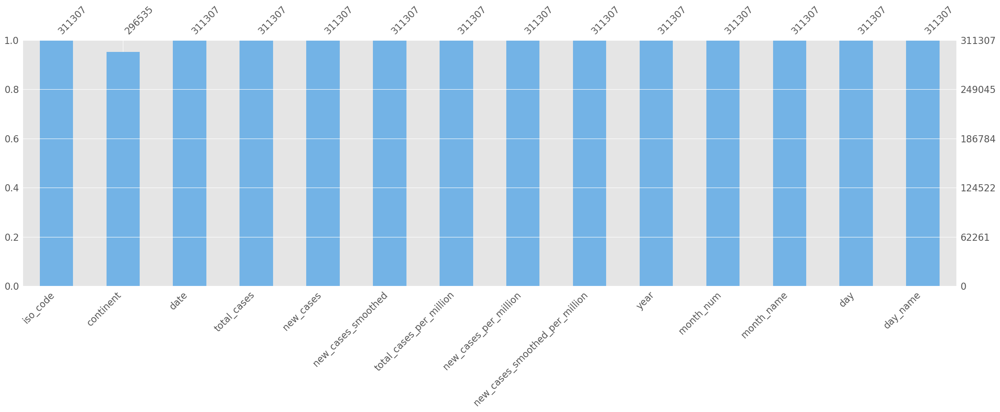

In [51]:
msno.bar(df_cases, labels=True, color=(0.45, 0.70, 0.90))

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

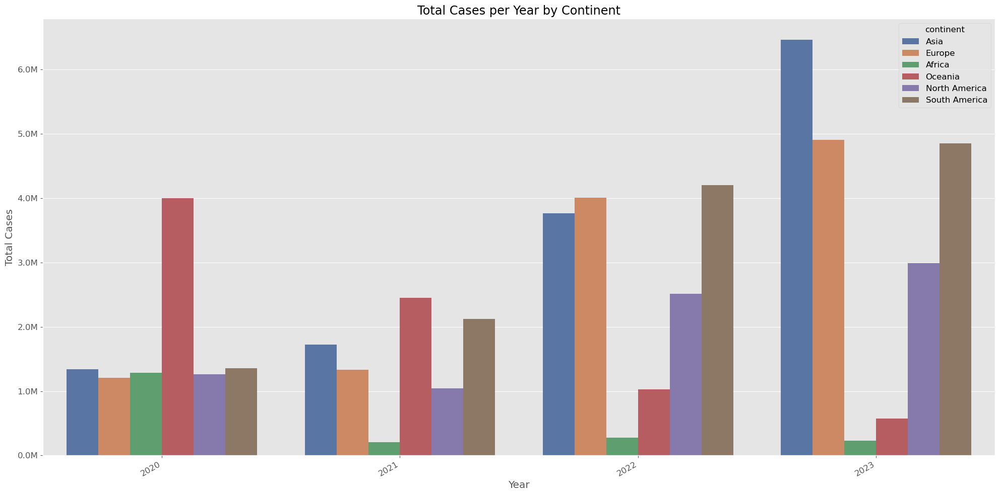

In [52]:
plot_bar(
    data=df_cases,
    x='year', y='total_cases', hue='continent', palette='deep',
    title='Total Cases per Year by Continent', xlabel='Year', ylabel='Total Cases', 
    formatter=format_mill
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

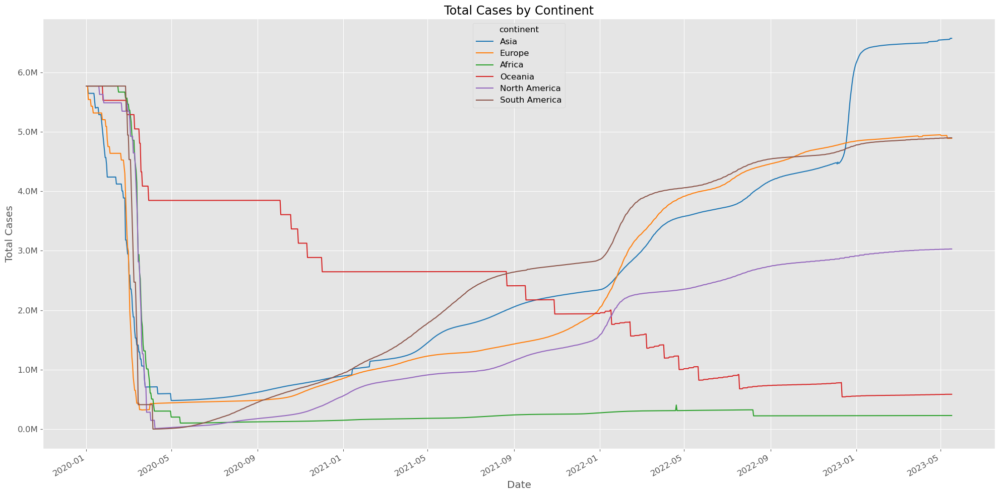

In [53]:
plot_line(
    data=df_cases,
    x='date', y='total_cases', hue='continent', palette='tab10', 
    title='Total Cases by Continent', xlabel='Date', ylabel='Total Cases', 
    formatter=format_mill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

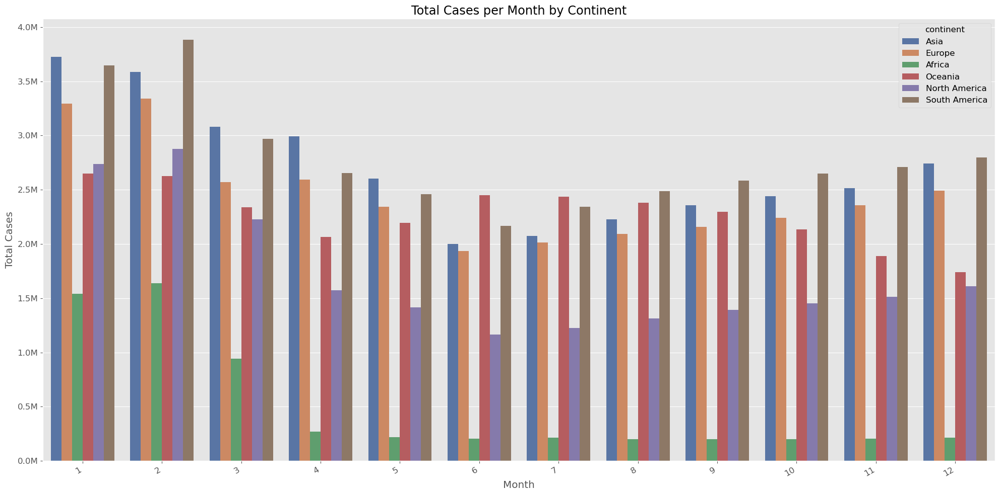

In [54]:
plot_bar(
    data=df_cases,
    x='month_num', y='total_cases', hue='continent', palette='deep', 
    title='Total Cases per Month by Continent', xlabel='Month', ylabel='Total Cases', 
    formatter=format_mill
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

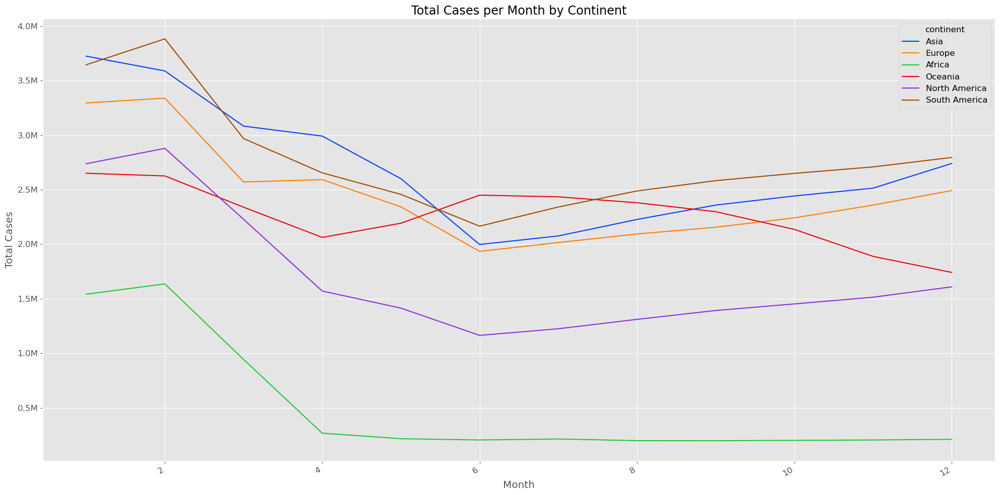

In [55]:
plot_line(
    data=df_cases,
    x='month_num', y='total_cases', hue='continent', palette='bright', 
    title='Total Cases per Month by Continent', xlabel='Month', ylabel='Total Cases',
    formatter=format_mill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

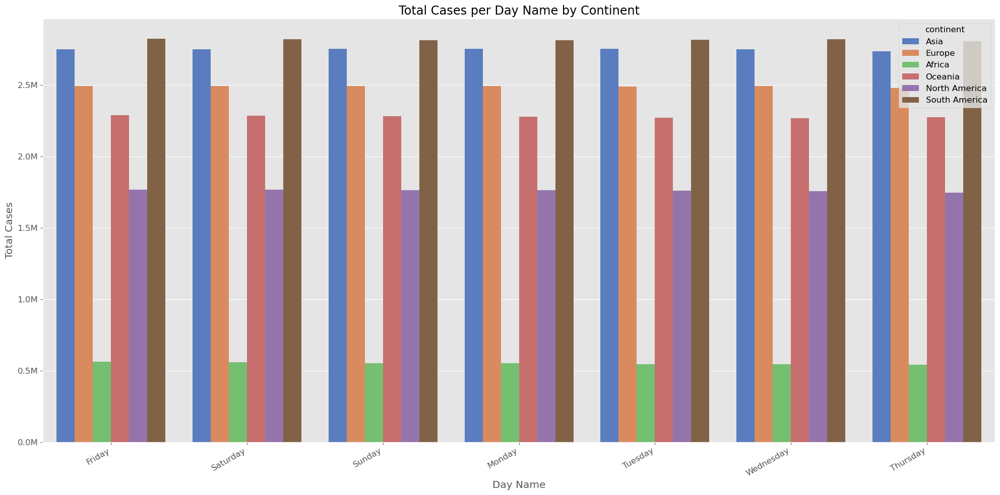

In [56]:
plot_bar(
    data=df_cases,
    x='day_name', y='total_cases', hue='continent', palette='muted',
    title='Total Cases per Day Name by Continent', xlabel='Day Name', ylabel='Total Cases', 
    formatter=format_mill
)

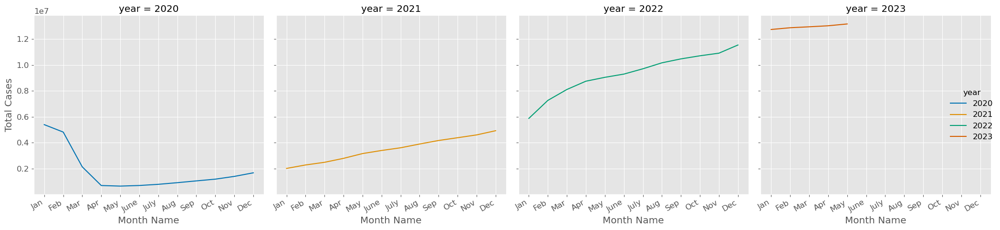

In [57]:
g = sns.relplot(
  data=df_cases,
  x='month_name', y='total_cases', ci=None,
  col='year', hue='year', palette='colorblind',
  kind='line'
)

g.set(xlabel='Month Name', ylabel='Total Cases')
g.fig.autofmt_xdate()
ax.yaxis.set_major_formatter(format_mill)

# Deaths Exploration

In [58]:
deaths_cols = ['iso_code', 'continent', 'date', 'total_deaths', 'new_deaths', 'new_deaths_smoothed', 'total_deaths_per_million', 
               'new_deaths_per_million', 'new_deaths_smoothed_per_million', 'year', 'month_num', 'month_name', 'day', 'day_name']

df_deaths = df_filled[deaths_cols]
df_deaths.head()

,iso_code,continent,date,total_deaths,new_deaths,new_deaths_smoothed,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,year,month_num,month_name,day,day_name
0,AFG,Asia,2020-01-03,80616.61459,0.0,96.10365,811.19407,0.0,1.01943,2020,1,Jan,3,Friday
1,AFG,Asia,2020-01-04,80616.61459,0.0,96.10365,811.19407,0.0,1.01943,2020,1,Jan,4,Saturday
2,AFG,Asia,2020-01-05,80616.61459,0.0,96.10365,811.19407,0.0,1.01943,2020,1,Jan,5,Sunday
3,AFG,Asia,2020-01-06,80616.61459,0.0,96.10365,811.19407,0.0,1.01943,2020,1,Jan,6,Monday
4,AFG,Asia,2020-01-07,80616.61459,0.0,96.10365,811.19407,0.0,1.01943,2020,1,Jan,7,Tuesday


In [59]:
df_deaths[['total_deaths', 'new_deaths', 'new_deaths_smoothed', 'total_deaths_per_million', 'new_deaths_per_million', 'new_deaths_smoothed_per_million']].describe()

,total_deaths,new_deaths,new_deaths_smoothed,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million
count,3.11307e+05,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000
mean,8.06166e+04,95.74095,96.10365,811.19407,1.01563,1.01943
std,3.76654e+05,592.37820,581.95020,953.04057,4.61118,2.86661
min,1.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000
25%,1.75000e+02,0.00000,0.00000,76.60050,0.00000,0.00000
50%,3.15500e+03,0.00000,0.28600,628.53600,0.00000,0.04700
75%,8.06166e+04,7.00000,8.85700,981.02900,0.57100,0.92800
max,6.93258e+06,20027.00000,14677.85700,6476.31900,603.65600,148.64100


In [60]:
df_deaths.isna().sum()                                   # check missing values

iso_code                               0
continent                          14772
date                                   0
total_deaths                           0
new_deaths                             0
new_deaths_smoothed                    0
total_deaths_per_million               0
new_deaths_per_million                 0
new_deaths_smoothed_per_million        0
year                                   0
month_num                              0
month_name                             0
day                                    0
day_name                               0
dtype: int64

<Axes: >

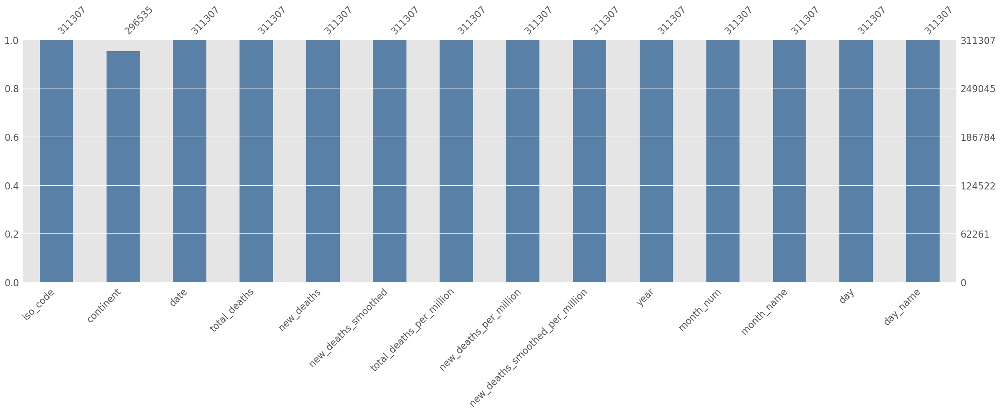

In [61]:
msno.bar(df_deaths, labels=True, color=(0.35, 0.50, 0.65))

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

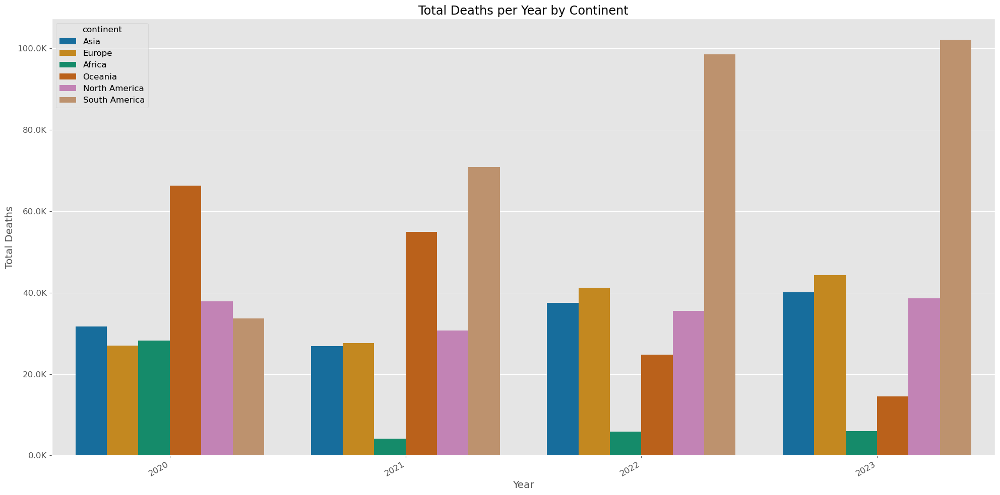

In [62]:
plot_bar(
    data=df_deaths,
    x='year', y='total_deaths', hue='continent', palette='colorblind', 
    title='Total Deaths per Year by Continent', xlabel='Year', ylabel='Total Deaths', 
    formatter=format_tsd
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

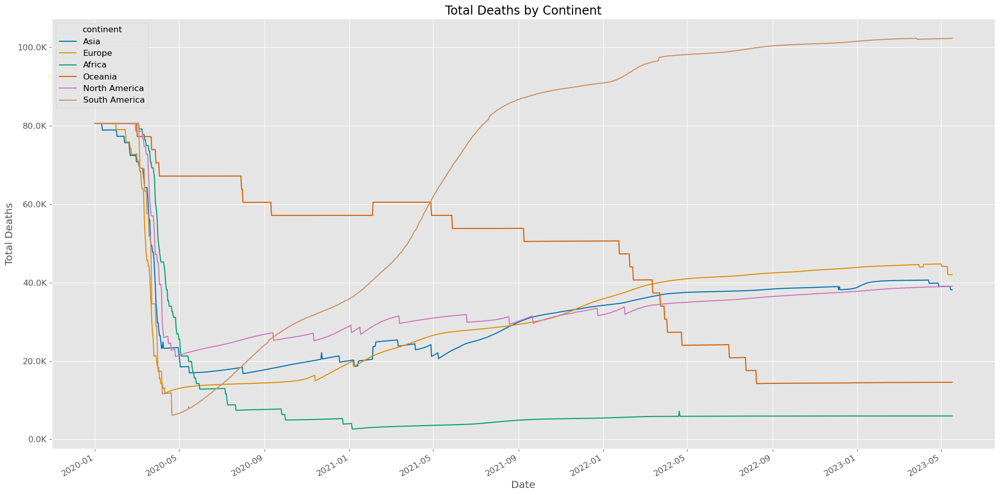

In [63]:
plot_line(
    data=df_deaths,
    x='date', y='total_deaths', hue='continent', palette='colorblind',
    title='Total Deaths by Continent', xlabel='Date', ylabel='Total Deaths', 
    formatter=format_tsd
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

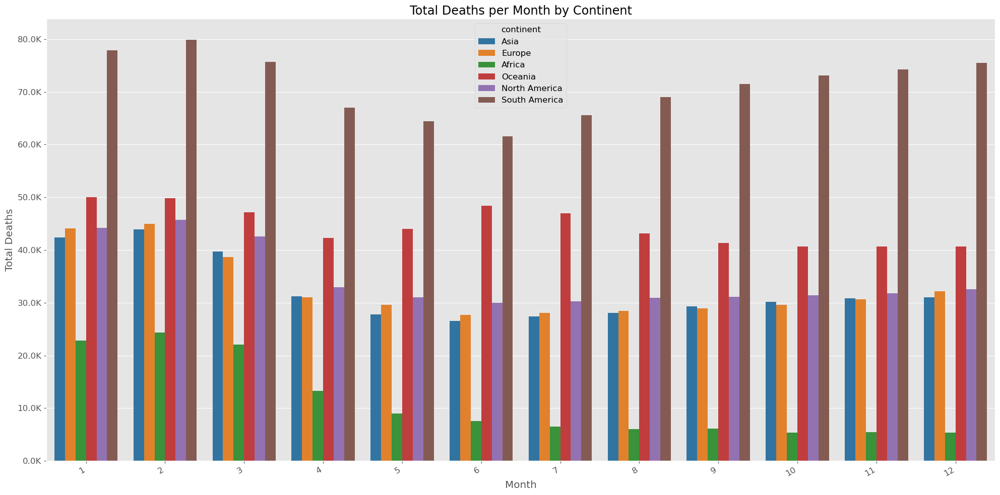

In [64]:
plot_bar(
    data=df_deaths,
    x='month_num', y='total_deaths', hue='continent', palette='tab10', 
    title='Total Deaths per Month by Continent', xlabel='Month', ylabel='Total Deaths', 
    formatter=format_tsd
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

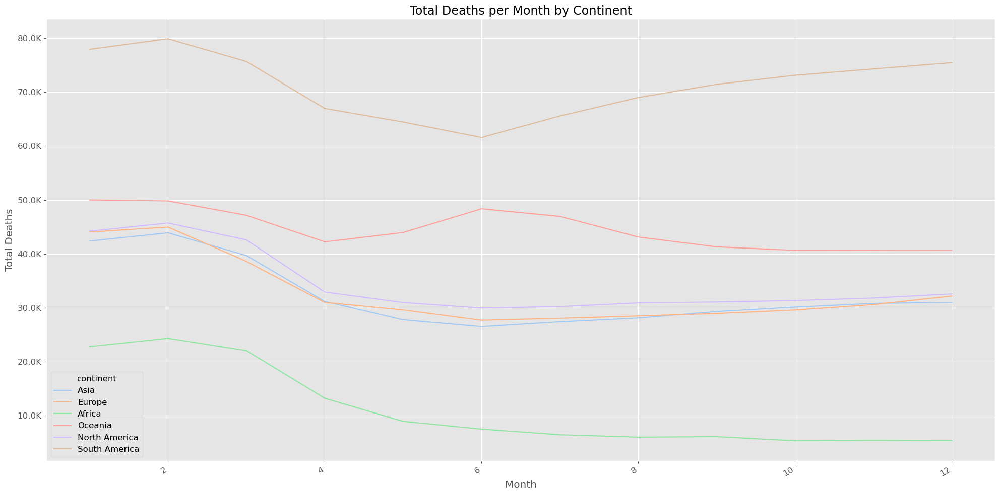

In [65]:
plot_line(
    data=df_deaths,
    x='month_num', y='total_deaths', hue='continent', palette='pastel',
    title='Total Deaths per Month by Continent', xlabel='Month', ylabel='Total Deaths', 
    formatter=format_tsd
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

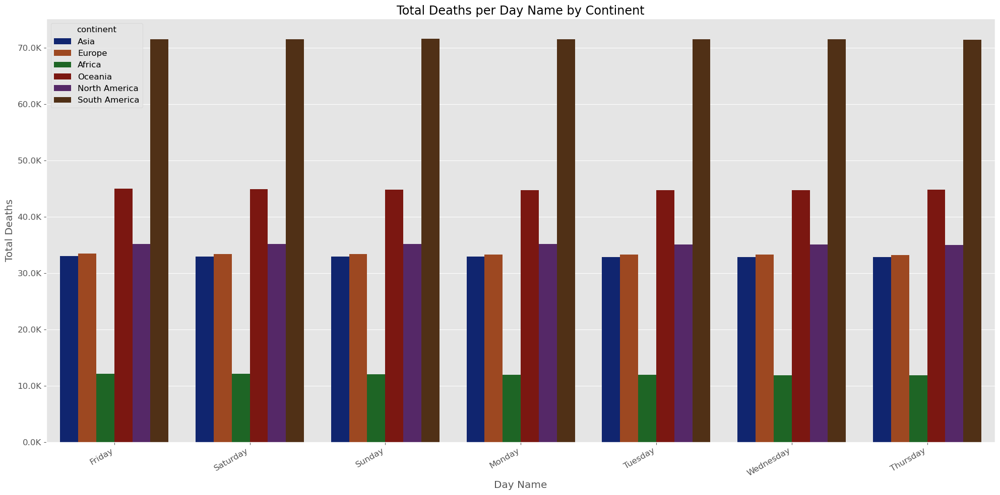

In [66]:
plot_bar(
    data=df_deaths,
    x='day_name', y='total_deaths', hue='continent', palette='dark',
    title='Total Deaths per Day Name by Continent', xlabel='Day Name', ylabel='Total Deaths', 
    formatter=format_tsd
)

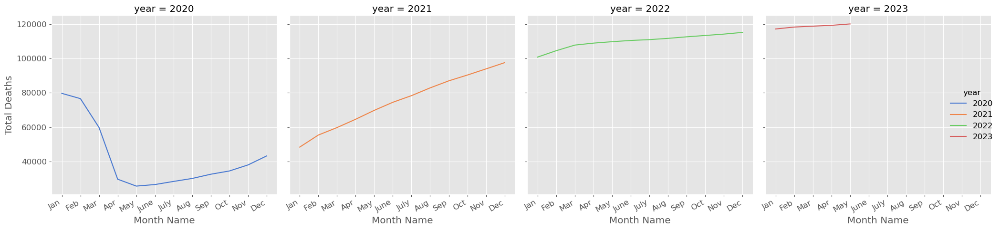

In [67]:
g1 = sns.relplot(
  data=df_deaths,
  x='month_name', y='total_deaths', ci=None, 
  col='year', hue='year', palette='muted',
  kind='line'
)

g1.set(xlabel='Month Name', ylabel='Total Deaths')
g1.fig.autofmt_xdate()

# Tests Exploration

In [68]:
test_cols = ['iso_code', 'continent', 'date', 'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_per_thousand', 
             'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'positive_rate', 'tests_per_case', 'tests_units', 'year', 'month_num', 
             'month_name', 'day', 'day_name']

df_test = df_filled[test_cols]
df_test.head()

,iso_code,continent,date,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,year,month_num,month_name,day,day_name
0,AFG,Asia,2020-01-03,67285.41212,2.11046e+07,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,2020,1,Jan,3,Friday
1,AFG,Asia,2020-01-04,67285.41212,2.11046e+07,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,2020,1,Jan,4,Saturday
2,AFG,Asia,2020-01-05,67285.41212,2.11046e+07,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,2020,1,Jan,5,Sunday
3,AFG,Asia,2020-01-06,67285.41212,2.11046e+07,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,2020,1,Jan,6,Monday
4,AFG,Asia,2020-01-07,67285.41212,2.11046e+07,924.25476,3.27247,142178.3637,2.82631,0.09816,2403.63281,NaN,2020,1,Jan,7,Tuesday


In [69]:
df_test[['new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_per_thousand', 'new_tests_smoothed',
         'new_tests_smoothed_per_thousand', 'positive_rate', 'tests_per_case', 'tests_units']].describe()

,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case
count,3.11307e+05,3.11307e+05,311307.00000,311307.00000,3.11307e+05,311307.00000,311307.00000,3.11307e+05
mean,6.72854e+04,2.11046e+07,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03
std,1.21922e+05,4.24686e+07,1108.65779,4.44601,6.57767e+05,4.22338,0.06438,1.84113e+04
min,1.00000e+00,0.00000e+00,0.00000,0.00000,0.00000e+00,0.00000,0.00000,1.00000e+00
25%,6.72854e+04,2.11046e+07,924.25476,3.27247,3.18395e+04,2.56850,0.09816,9.09000e+01
50%,6.72854e+04,2.11046e+07,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03
75%,6.72854e+04,2.11046e+07,924.25476,3.27247,1.42178e+05,2.82631,0.09816,2.40363e+03
max,3.58556e+07,9.21400e+09,32925.82600,531.06200,1.47700e+07,147.60300,1.00000,1.02363e+06


In [70]:
df_test.isna().sum()                                   # check missing values

iso_code                                0
continent                           14772
date                                    0
new_tests                               0
total_tests                             0
total_tests_per_thousand                0
new_tests_per_thousand                  0
new_tests_smoothed                      0
new_tests_smoothed_per_thousand         0
positive_rate                           0
tests_per_case                          0
tests_units                        204519
year                                    0
month_num                               0
month_name                              0
day                                     0
day_name                                0
dtype: int64

<Axes: >

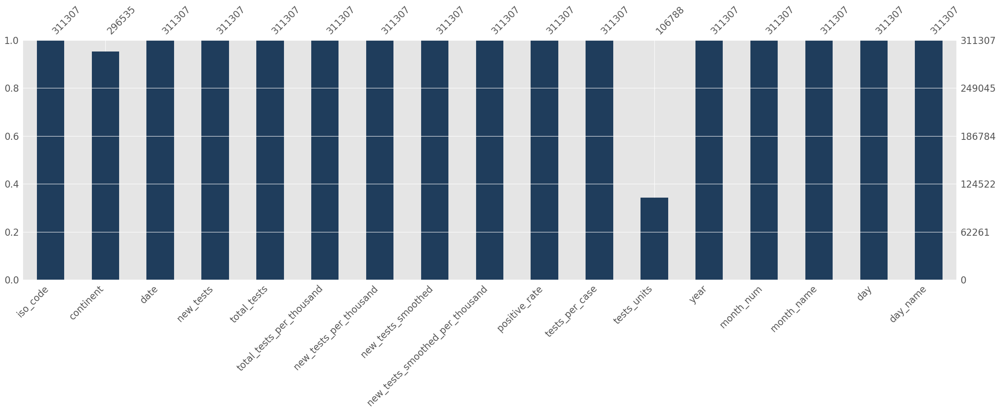

In [71]:
msno.bar(df_test, labels=True, color=(0.12, 0.24, 0.36))

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

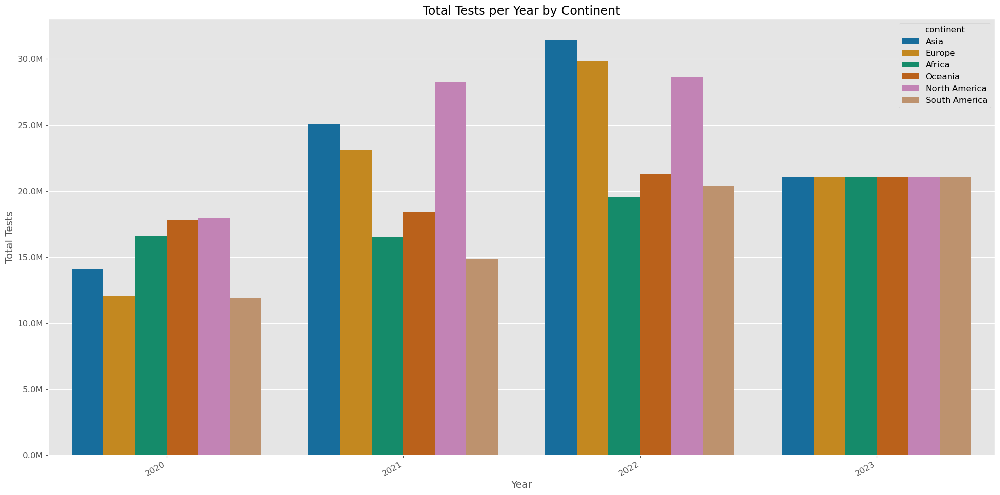

In [72]:
plot_bar(
    data=df_test,
    x='year', y='total_tests', hue='continent', palette='colorblind',
    title='Total Tests per Year by Continent', xlabel='Year', ylabel='Total Tests', 
    formatter=format_mill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

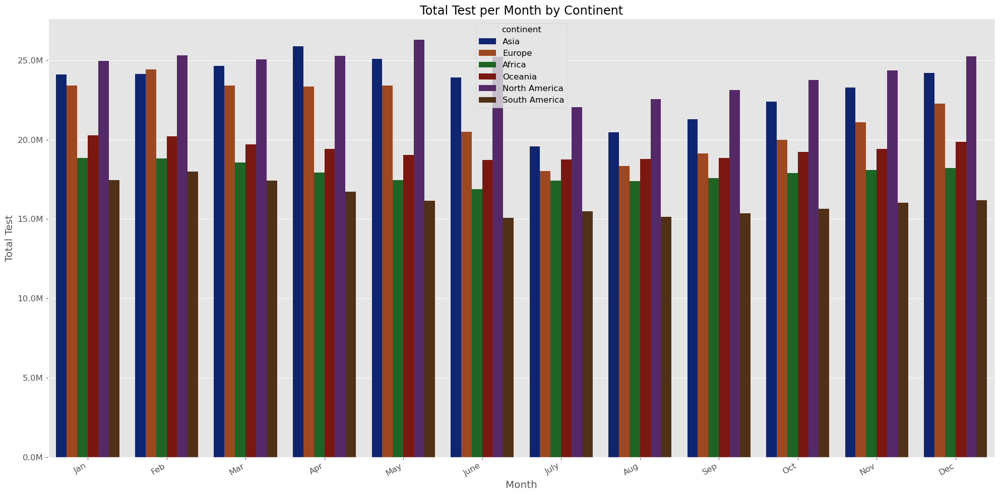

In [73]:
plot_bar(
    data=df_test,
    x='month_name', y='total_tests', hue='continent', palette='dark', 
    title='Total Test per Month by Continent', xlabel='Month', ylabel='Total Test', 
    formatter=format_mill
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

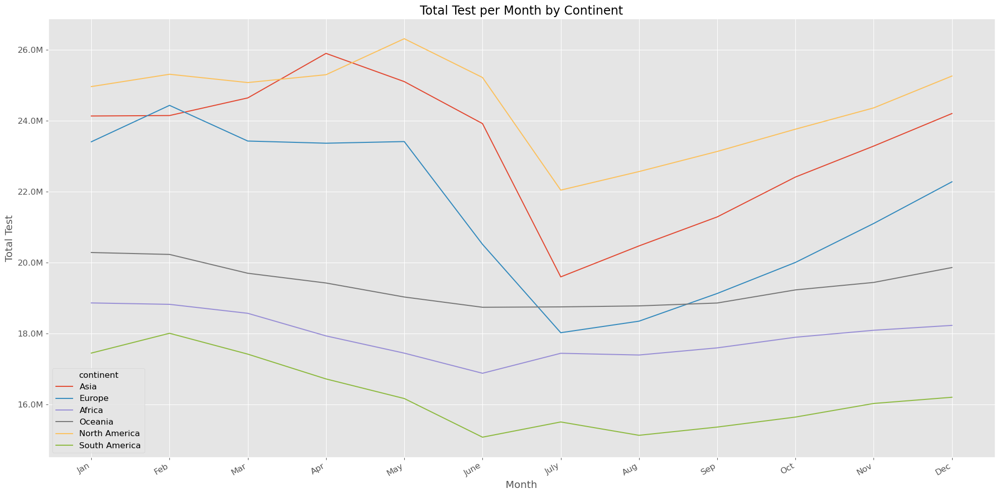

In [74]:
plot_line(
    data=df_test,
    x='month_name', y='total_tests', hue='continent', 
    title='Total Test per Month by Continent', xlabel='Month', ylabel='Total Test', 
    formatter=format_mill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

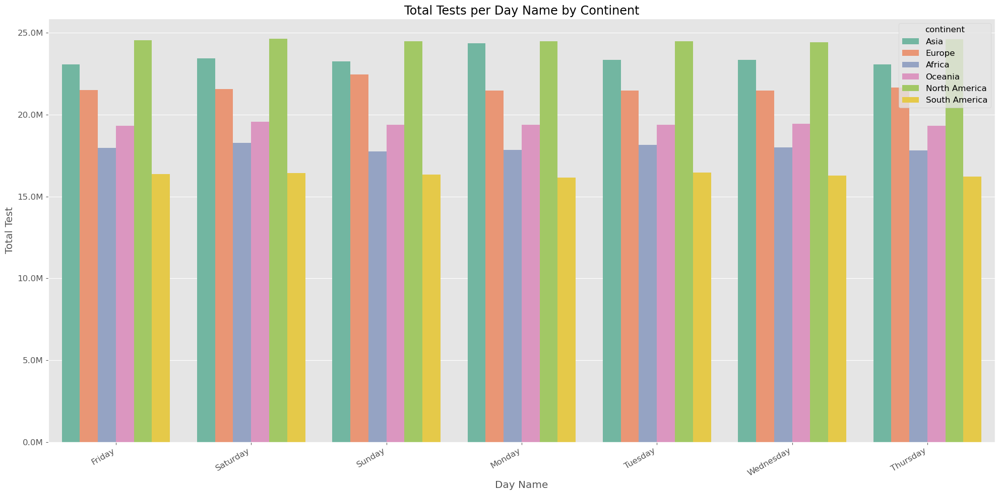

In [75]:
plot_bar(
    data=df_test,
    x='day_name', y='total_tests', hue='continent', palette='Set2',
    title='Total Tests per Day Name by Continent', xlabel='Day Name', ylabel='Total Test', 
    formatter=format_mill
)

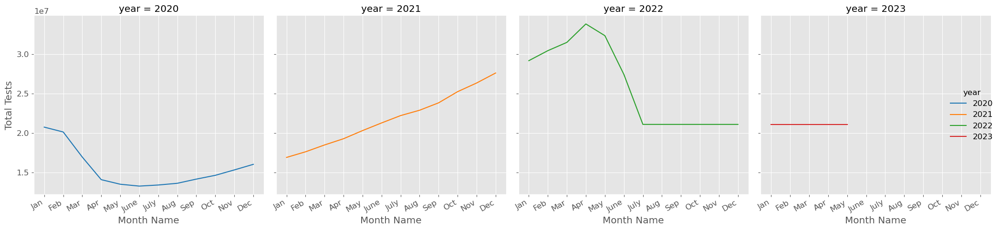

In [76]:
g2 = sns.relplot(
  data=df_test,
  x='month_name', y='total_tests', ci=None,
  col='year', hue='year', palette='tab10',
  kind='line'
)

g2.set(xlabel='Month Name', ylabel='Total Tests')
g2.fig.autofmt_xdate()

# Vaccinations Exploration

In [77]:
vacc_cols = ['iso_code', 'continent', 'date', 'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'new_vaccinations', 'new_vaccinations_smoothed',
             'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',
             'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed', 'new_people_vaccinated_smoothed_per_hundred',
             'year', 'month_num', 'month_name', 'day', 'day_name']

df_vacc = df_filled[vacc_cols]
df_vacc.head()

,iso_code,continent,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,year,month_num,month_name,day,day_name
0,AFG,Asia,2020-01-03,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,2020,1,Jan,3,Friday
1,AFG,Asia,2020-01-04,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,2020,1,Jan,4,Saturday
2,AFG,Asia,2020-01-05,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,2020,1,Jan,5,Sunday
3,AFG,Asia,2020-01-06,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,2020,1,Jan,6,Monday
4,AFG,Asia,2020-01-07,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,842140.486,326186.24592,114.50535,50.84334,45.97845,32.78559,2114.53231,120711.65661,0.08559,2020,1,Jan,7,Tuesday


In [78]:
df_vacc[['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'new_vaccinations', 'new_vaccinations_smoothed',
         'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',
         'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed', 'new_people_vaccinated_smoothed_per_hundred']].describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred
count,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,3.11307e+05,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,3.11307e+05,311307.00000
mean,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559
std,6.98983e+08,3.03875e+08,2.71477e+08,1.20774e+08,1.51337e+06,1.51805e+06,41.19025,14.37172,13.94640,11.20835,2407.87891,6.17341e+05,0.13686
min,0.00000e+00,0.00000e+00,1.00000e+00,1.00000e+00,0.00000e+00,0.00000e+00,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000e+00,0.00000
25%,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.46900e+03,114.50535,50.84334,45.97845,32.78559,696.00000,8.14000e+02,0.01600
50%,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559
75%,3.77849e+08,1.68604e+08,1.49728e+08,9.24448e+07,8.42140e+05,3.26186e+05,114.50535,50.84334,45.97845,32.78559,2114.53231,1.20712e+05,0.08559
max,1.33817e+10,5.58149e+09,5.13288e+09,2.76395e+09,4.96734e+07,4.36930e+07,406.43000,129.07000,126.89000,150.47000,117113.00000,2.10712e+07,11.71100


In [79]:
df_vacc.isna().sum()                                   # check missing values

iso_code                                          0
continent                                     14772
date                                              0
total_vaccinations                                0
people_vaccinated                                 0
people_fully_vaccinated                           0
total_boosters                                    0
new_vaccinations                                  0
new_vaccinations_smoothed                         0
total_vaccinations_per_hundred                    0
people_vaccinated_per_hundred                     0
people_fully_vaccinated_per_hundred               0
total_boosters_per_hundred                        0
new_vaccinations_smoothed_per_million             0
new_people_vaccinated_smoothed                    0
new_people_vaccinated_smoothed_per_hundred        0
year                                              0
month_num                                         0
month_name                                        0
day         

<Axes: >

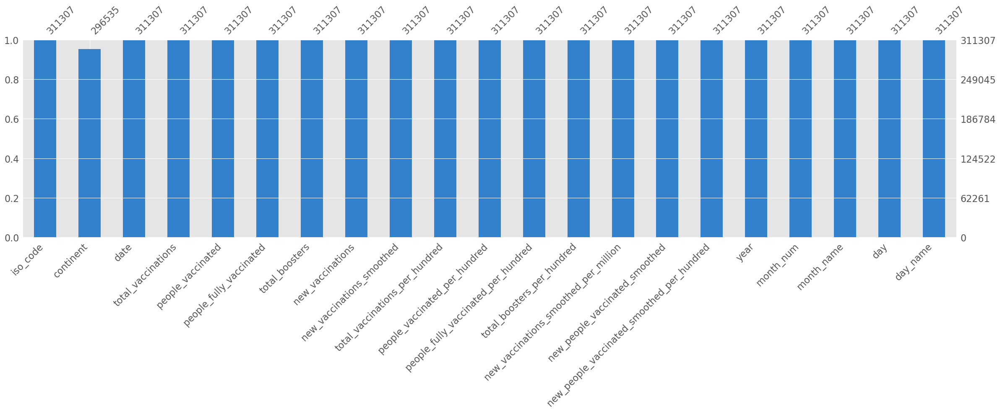

In [80]:
msno.bar(df_vacc, labels=True, color=(0.20, 0.50, 0.80))

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

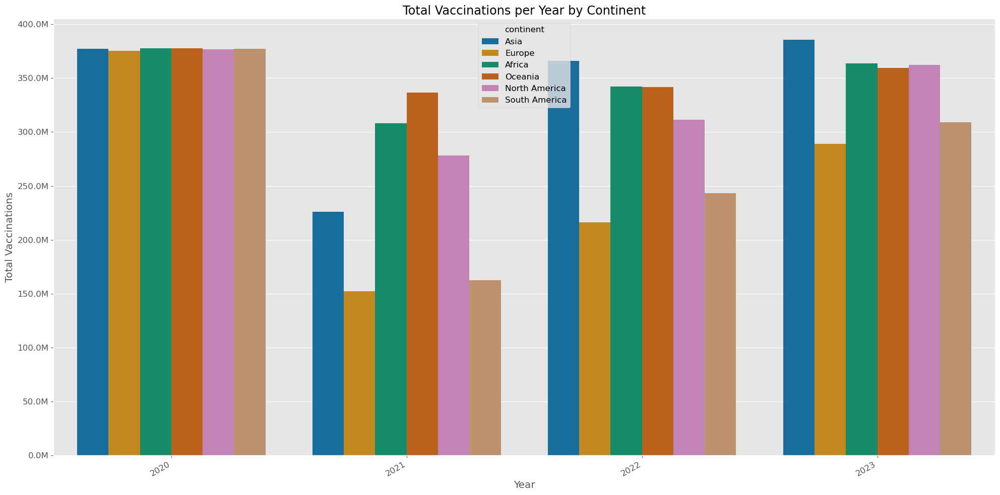

In [81]:
plot_bar(
    data=df_vacc,
    x='year', y='total_vaccinations', hue='continent', palette='colorblind', 
    title='Total Vaccinations per Year by Continent', xlabel='Year', ylabel='Total Vaccinations', 
    formatter=format_mill
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

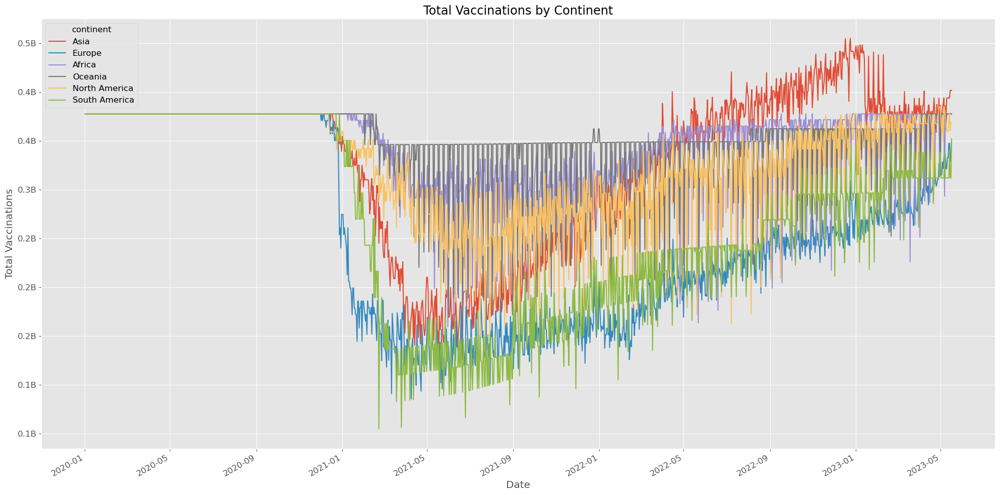

In [82]:
plot_line(
    data=df_vacc,
    x='date', y='total_vaccinations', hue='continent', 
    title='Total Vaccinations by Continent', xlabel='Date', ylabel='Total Vaccinations', 
    formatter=format_bill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

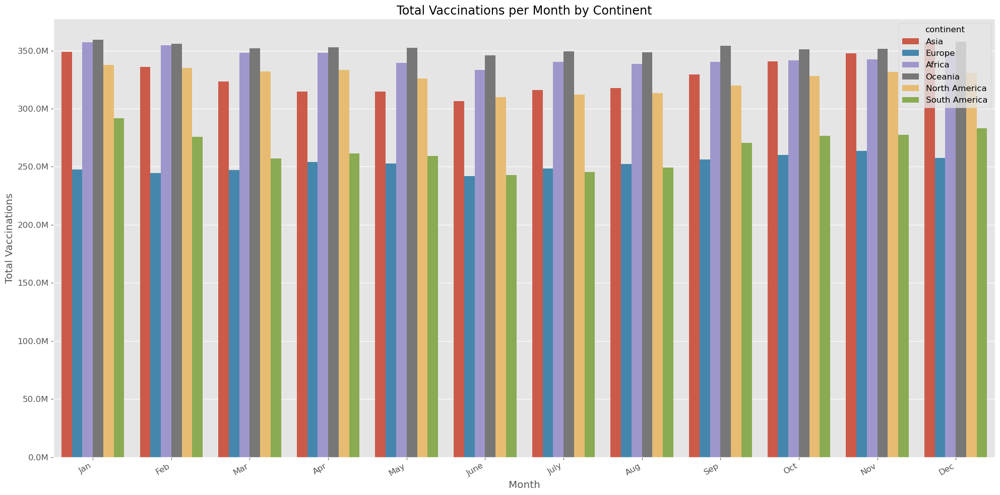

In [83]:
plot_bar(
    data=df_vacc,
    x='month_name', y='total_vaccinations', hue='continent', 
    title='Total Vaccinations per Month by Continent', xlabel='Month', ylabel='Total Vaccinations', 
    formatter=format_mill
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

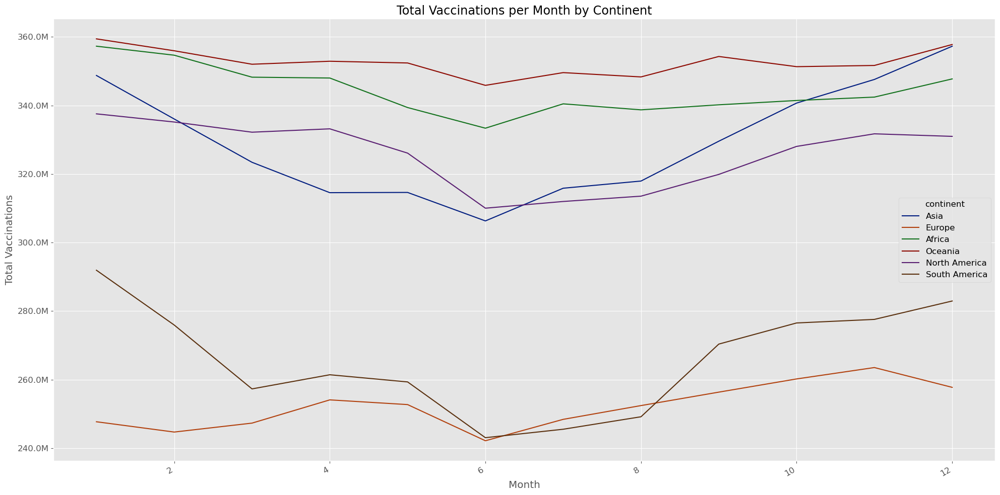

In [84]:
plot_line(
    data=df_vacc,
    x='month_num', y='total_vaccinations', hue='continent', palette='dark', 
    title='Total Vaccinations per Month by Continent', xlabel='Month', ylabel='Total Vaccinations', 
    formatter=format_mill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

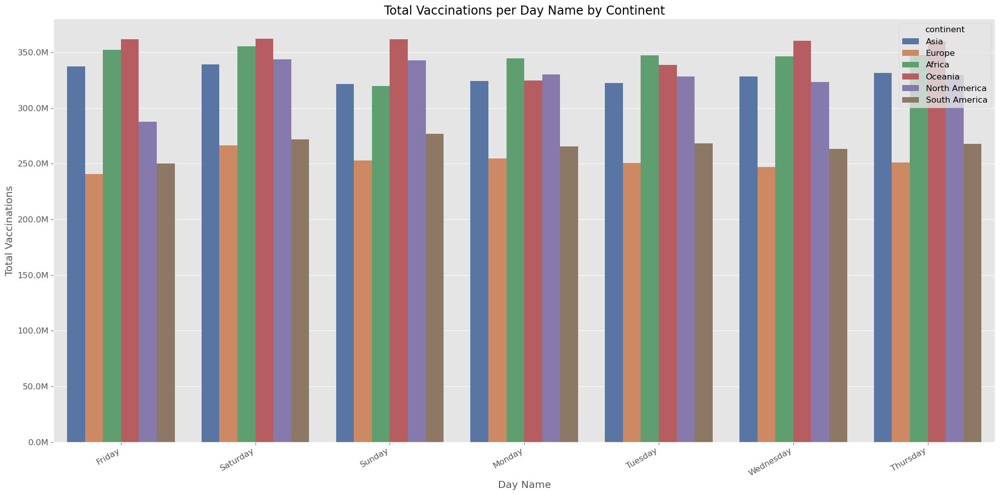

In [85]:
plot_bar(
    data=df_vacc,
    x='day_name', y='total_vaccinations', hue='continent', palette='deep', 
    title='Total Vaccinations per Day Name by Continent', xlabel='Day Name', ylabel='Total Vaccinations', 
    formatter=format_mill
)

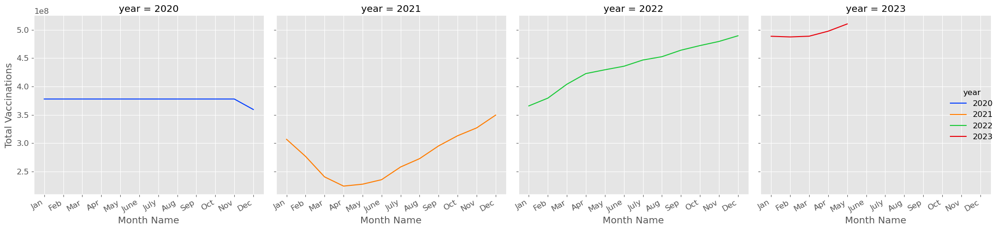

In [86]:
g3 = sns.relplot(
  data=df_vacc,
  x='month_name', y='total_vaccinations', ci=None,
  col='year', hue='year', palette='bright',
  kind='line'
)

g3.set(xlabel='Month Name', ylabel='Total Vaccinations')
g3.fig.autofmt_xdate()

# Demographics Exploration

In [87]:
demo_cols = ['iso_code', 'continent', 'date', 'population', 'population_density', 'median_age', 'aged_65_older', 'aged_70_older', 
             'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers', 'male_smokers', 
             'handwashing_facilities', 'hospital_beds_per_thousand', 'life_expectancy', 'human_development_index','excess_mortality_cumulative_absolute', 
             'excess_mortality_cumulative', 'excess_mortality', 'excess_mortality_cumulative_per_million', 'year', 'month_num', 'month_name', 
             'day', 'day_name']

df_demo = df_filled[demo_cols]
df_demo.head()

,iso_code,continent,date,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,year,month_num,month_name,day,day_name
0,AFG,Asia,2020-01-03,41128772.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,47396.67985,9.5389,12.63355,1477.14968,2020,1,Jan,3,Friday
1,AFG,Asia,2020-01-04,41128772.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,47396.67985,9.5389,12.63355,1477.14968,2020,1,Jan,4,Saturday
2,AFG,Asia,2020-01-05,41128772.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,47396.67985,9.5389,12.63355,1477.14968,2020,1,Jan,5,Sunday
3,AFG,Asia,2020-01-06,41128772.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,47396.67985,9.5389,12.63355,1477.14968,2020,1,Jan,6,Monday
4,AFG,Asia,2020-01-07,41128772.0,54.422,18.6,2.581,1.337,1803.987,13.8481,597.029,9.59,10.79006,32.90965,37.746,0.5,64.83,0.511,47396.67985,9.5389,12.63355,1477.14968,2020,1,Jan,7,Tuesday


In [88]:
df_demo[['population', 'population_density', 'median_age', 'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate',
         'diabetes_prevalence', 'female_smokers', 'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand', 'life_expectancy', 
         'human_development_index', 'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative', 'excess_mortality', 
         'excess_mortality_cumulative_per_million']].describe()

,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,3.11307e+05,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,311307.00000,3.11307e+05,311307.00000,311307.00000,311307.00000
mean,1.28062e+08,411.02413,30.50924,8.69971,5.49887,19013.72762,13.84810,264.28804,8.56109,10.79006,32.90965,50.78933,3.09701,73.71750,0.72247,4.73967e+04,9.53890,12.63355,1477.14968
std,6.59506e+08,1728.04841,8.06950,5.31756,3.65498,17591.42464,14.18208,106.45345,4.45953,8.21846,10.27901,19.68986,2.10778,7.09431,0.12914,2.56247e+04,2.39061,4.87678,340.78448
min,4.70000e+01,0.13700,15.10000,1.14400,0.52600,661.24000,0.10000,79.37000,0.99000,0.10000,7.70000,1.18800,0.10000,53.28000,0.39400,-3.77261e+04,-44.23000,-95.92000,-1984.28160
25%,4.49002e+05,46.75400,24.90000,4.27700,2.39200,6222.55400,2.50000,199.94100,5.81000,5.10000,30.00000,50.78933,1.71000,70.39000,0.66500,4.73967e+04,9.53890,12.63355,1477.14968
50%,5.88226e+06,113.12800,30.50924,8.69971,5.49887,18563.30700,13.84810,264.28804,8.51000,10.79006,32.90965,50.78933,3.09701,74.25000,0.72247,4.73967e+04,9.53890,12.63355,1477.14968
75%,2.83017e+07,402.60600,36.20000,10.06900,6.48900,22267.03700,13.84810,298.24500,10.08000,10.79006,34.80000,50.78933,3.09701,78.93000,0.80600,4.73967e+04,9.53890,12.63355,1477.14968
max,7.97511e+09,20546.76600,48.20000,27.04900,18.49300,116935.60000,77.60000,724.41700,30.53000,44.00000,78.10000,100.00000,13.80000,86.75000,0.95700,1.28226e+06,76.55000,377.30000,10291.12200


In [89]:
df_demo.isna().sum()                                   # check missing values

iso_code                                       0
continent                                  14772
date                                           0
population                                     0
population_density                             0
median_age                                     0
aged_65_older                                  0
aged_70_older                                  0
gdp_per_capita                                 0
extreme_poverty                                0
cardiovasc_death_rate                          0
diabetes_prevalence                            0
female_smokers                                 0
male_smokers                                   0
handwashing_facilities                         0
hospital_beds_per_thousand                     0
life_expectancy                                0
human_development_index                        0
excess_mortality_cumulative_absolute           0
excess_mortality_cumulative                    0
excess_mortality    

<Axes: >

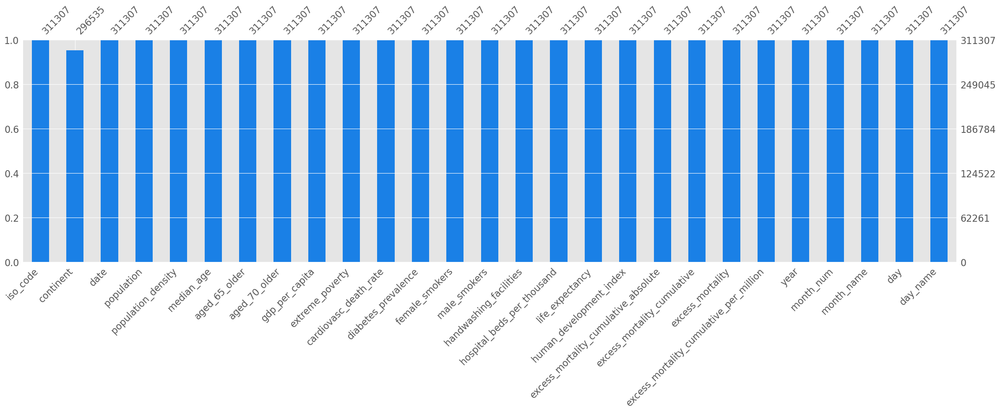

In [90]:
msno.bar(df_demo, labels=True, color=(0.1, 0.5, 0.9))

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

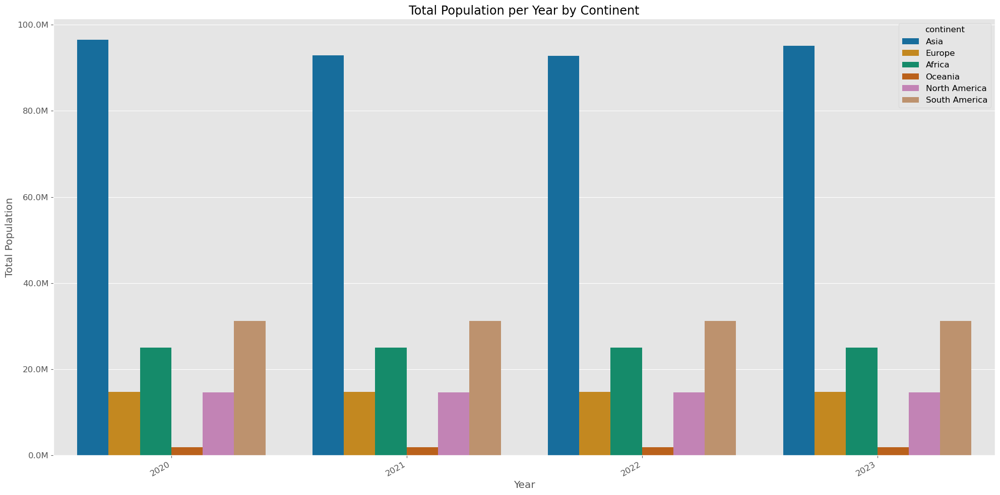

In [91]:
plot_bar(
    data=df_demo,
    x='year', y='population', hue='continent', palette='colorblind',
    title='Total Population per Year by Continent', xlabel='Year', ylabel='Total Population', 
    formatter=format_mill
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

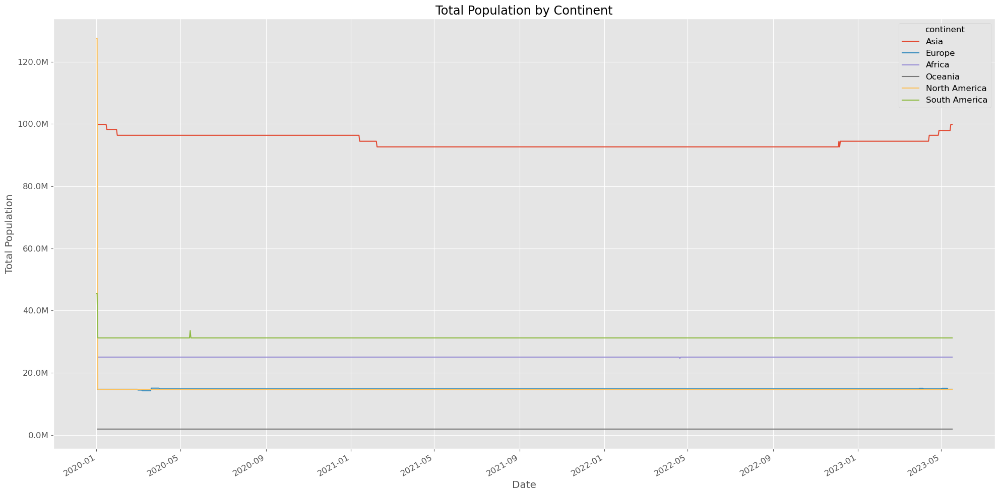

In [92]:
plot_line(
    data=df_demo,
    x='date', y='population', hue='continent', 
    title='Total Population by Continent', xlabel='Date', ylabel='Total Population', 
    formatter=format_mill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

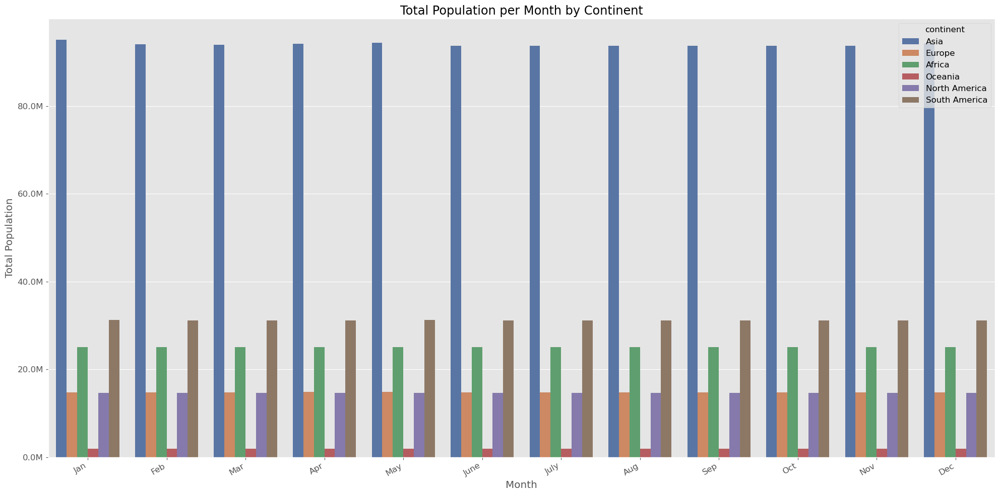

In [93]:
plot_bar(
    data=df_demo,
    x='month_name', y='population', hue='continent', palette='deep',
    title='Total Population per Month by Continent', xlabel='Month', ylabel='Total Population', 
    formatter=format_mill
)

<function __main__.plot_line(data, x, y, hue=None, palette=None, size=None, markers=None, style=None, ci=None, hue_order=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

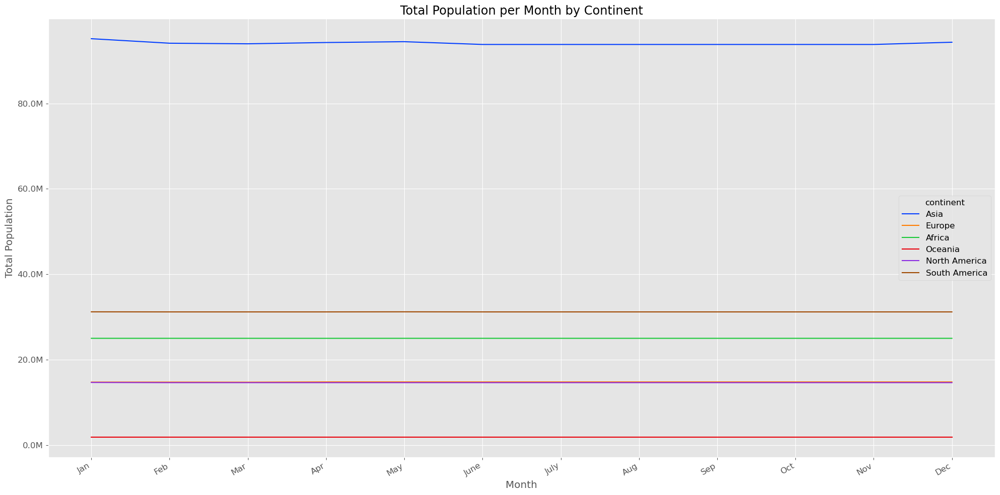

In [94]:
plot_line(
    data=df_demo,
    x='month_name', y='population', hue='continent', palette='bright', 
    title='Total Population per Month by Continent', xlabel='Month', ylabel='Total Population', 
    formatter=format_mill
)

<function __main__.plot_bar(data, x, y, hue=None, ci=None, color=None, hue_order=None, order=None, palette=None, xlabel=None, ylabel=None, title=None, formatter=None, **kwargs)>

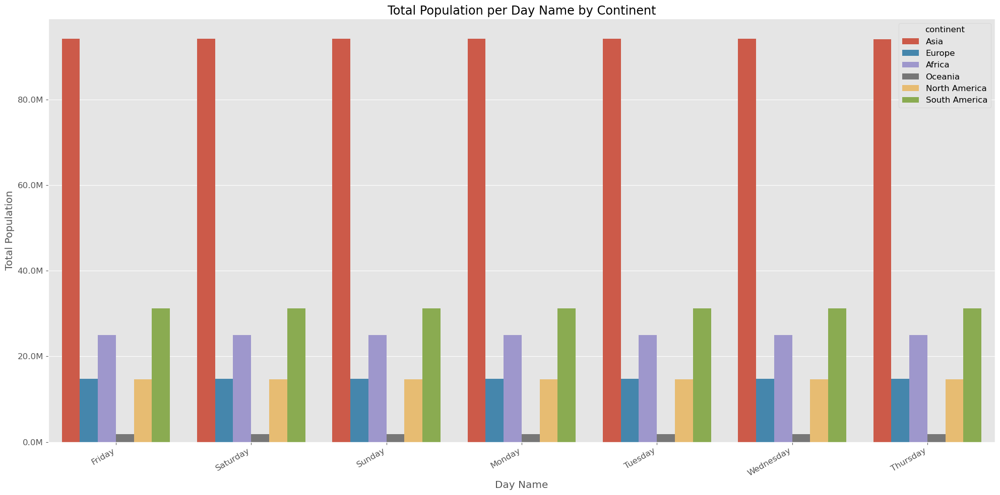

In [95]:
plot_bar(
    data=df_demo,
    x='day_name', y='population', hue='continent', 
    title='Total Population per Day Name by Continent', xlabel='Day Name', ylabel='Total Population', 
    formatter=format_mill
)

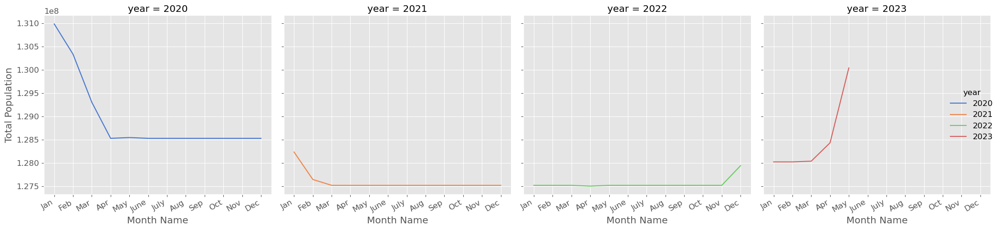

In [96]:
g4 = sns.relplot(
  data=df_demo,
  x='month_name', y='population', ci=None,
  col='year', hue='year', palette='muted',
  kind='line'
)

g4.set(xlabel='Month Name', ylabel='Total Population')
g4.fig.autofmt_xdate()

# Date Truncating or Indexing

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

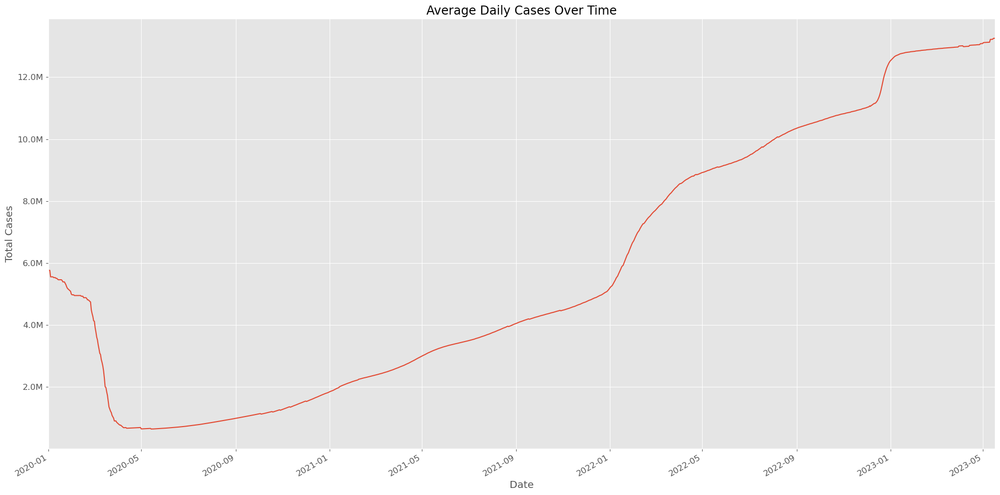

In [97]:
cols_to_use = ['date', 'total_cases']

plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], rule='D').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Average Daily Cases Over Time',
    formatter=format_mill
)

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

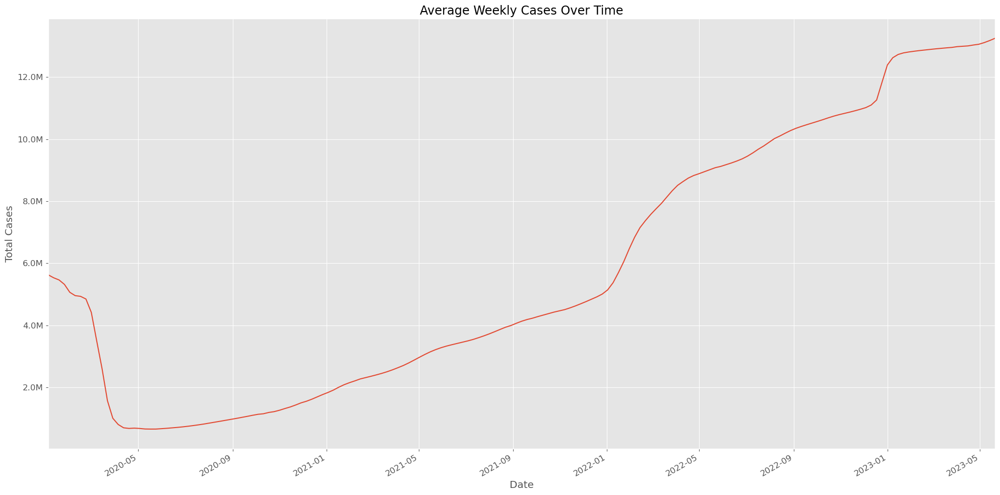

In [98]:
plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], rule='W').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Average Weekly Cases Over Time',
    formatter=format_mill
)

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

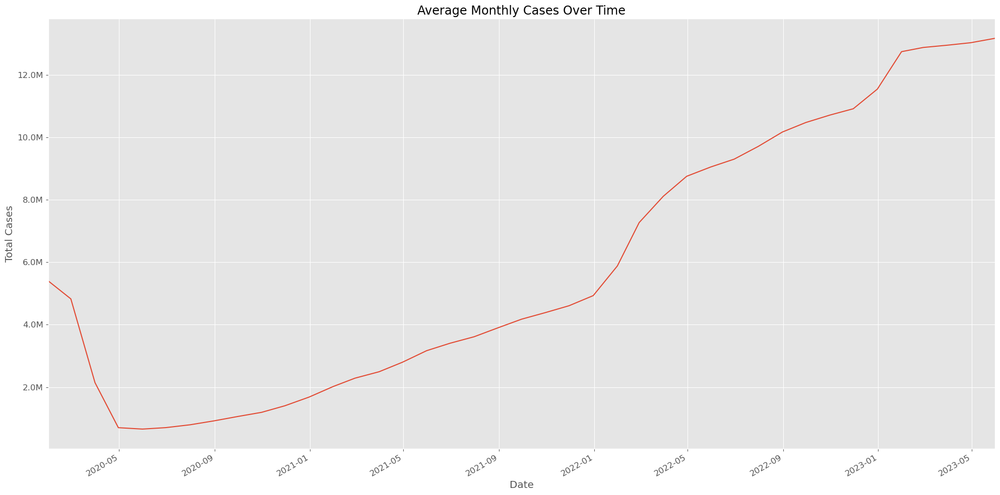

In [99]:
plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], rule='M').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Average Monthly Cases Over Time',
    formatter=format_mill
)

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

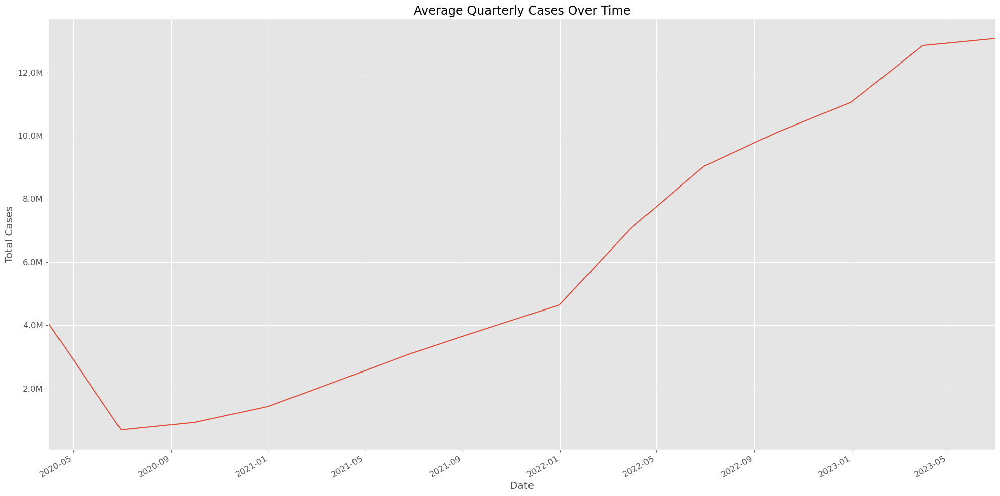

In [100]:
plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], rule='Q').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Average Quarterly Cases Over Time',
    formatter=format_mill
)

Plot Specific Date Range

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

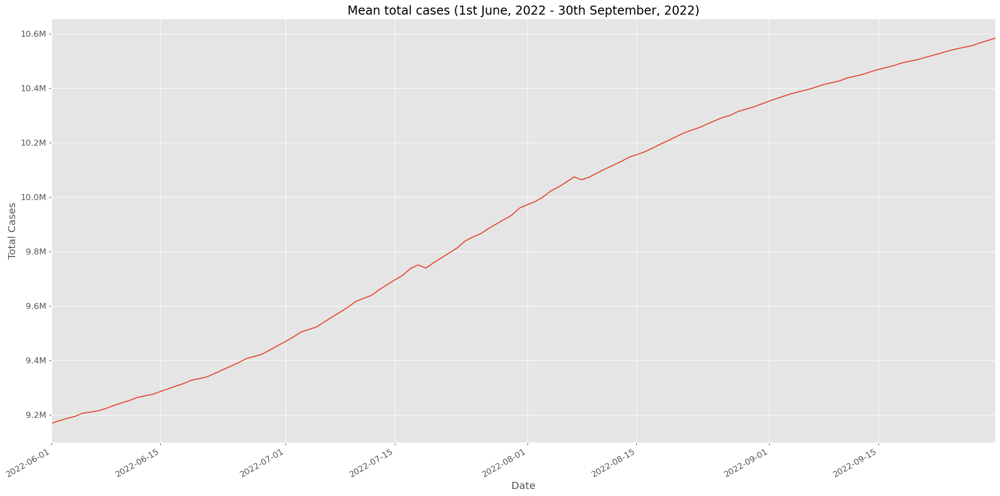

In [101]:
plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], before='2022-06-01', after='2022-09-30', rule='D').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Mean total cases (1st June, 2022 - 30th September, 2022)',
    formatter=format_mill
)

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

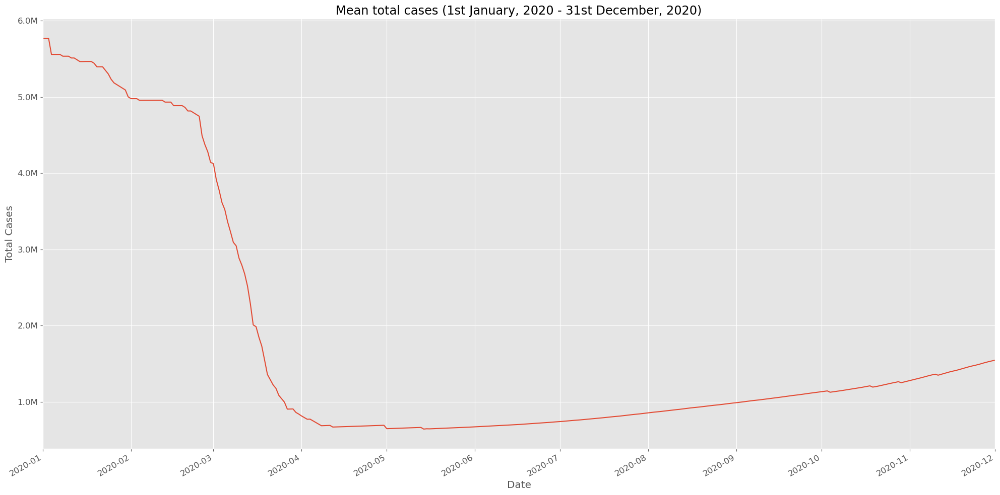

In [102]:
plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], before='2020-01-01', after='2020-12-01', rule='D').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Mean total cases (1st January, 2020 - 31st December, 2020)',
    formatter=format_mill
)

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

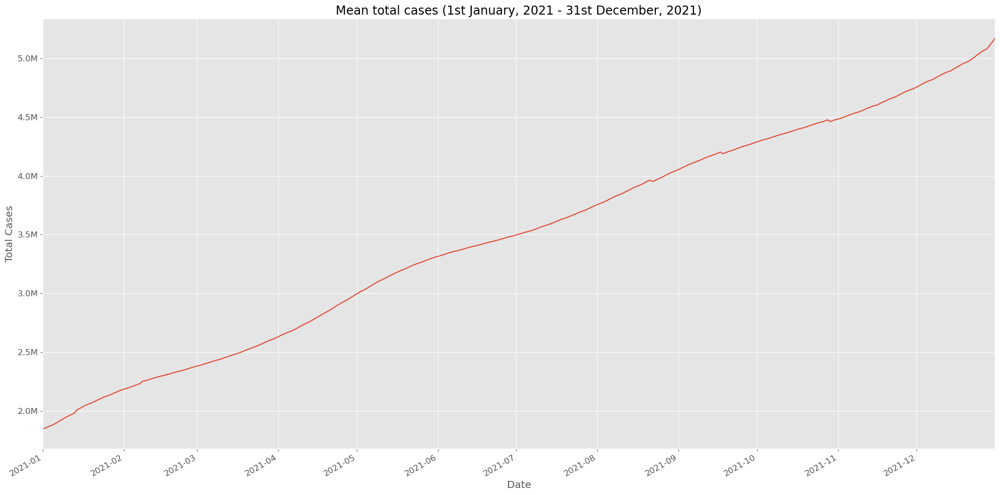

In [103]:
plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], before='2021-01-01', after='2021-12-31', rule='D').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Mean total cases (1st January, 2021 - 31st December, 2021)',
    formatter=format_mill
)

<function __main__.plot_date_rng(data, x, y, hue=None, hue_order=None, palette=None, title=None, xlabel=None, ylabel=None, formatter=None, **kwargs)>

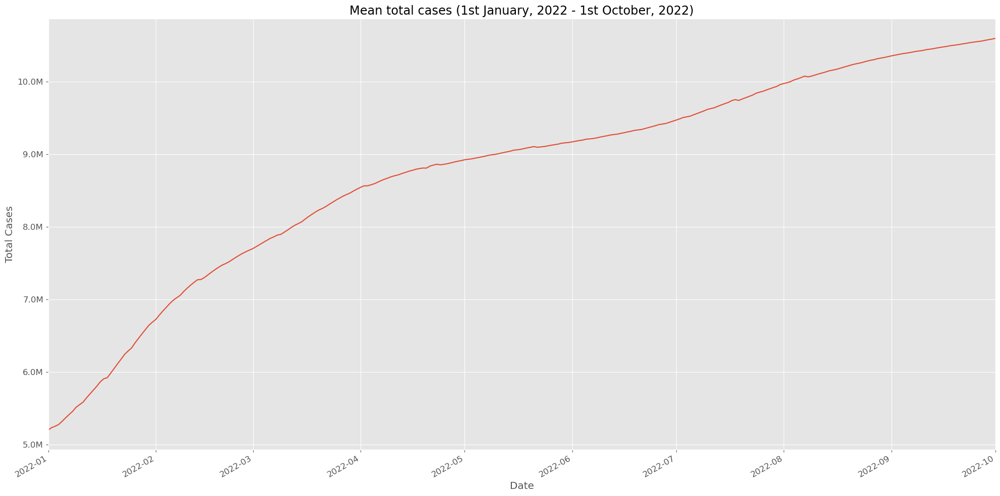

In [104]:
plot_date_rng(
    data=get_data(data=df_filled[cols_to_use], before='2022-01-01', after='2022-10-01', rule='D').agg(np.mean),
    x='date', y='total_cases',
    xlabel='Date', ylabel='Total Cases', title='Mean total cases (1st January, 2022 - 1st October, 2022)',
    formatter=format_mill
)